# Clustering & Structure of Buffalo Lactation Data

Consolidated clustering notebook. Merges the useful, de-duplicated code from `Clustering.ipynb`,
`Clustering_FeaturePairs.ipynb`, `Clustering_ParityStratified.ipynb`,
`FeaturePairs_Season_Climate.ipynb`, `Clustering_CurveShape_Heat.ipynb`, and
`Clustering_TimeSeries.ipynb` into one ordered analysis. Original notebooks are kept in `raw/`.

The parts follow the actual investigation, answering the professors' objection to PCA head-on:

1. **Part 1 — Baseline point-trait clustering** (K-Means / Hierarchical / DBSCAN, 3 levels).
2. **Part 2 — No-PCA feature-pair clustering** — cluster two *real* features at a time.
3. **Part 3 — Removing the parity confound** — cluster `milk_kg × DIM` within parity strata.
4. **Part 4 — Season & climate feature pairs** — trait×trait and climate×trait, split by season.
5. **Part 5 — Curve-shape clustering** — model-free + Wood's-feature curve *types* (the real structure).
6. **Part 6 — Linking curve types to heat & udder health (SCS)** — the season-controlled heat story.
7. **Part 7 — Regional & farm structure** — is geography a real grouping, or just a climate gradient?

**Headline findings:** raw production traits form a **continuum**, not discrete groups (the clean
feature pairs were a `parity` discreteness artifact); the real structure is in lactation-**curve
shape**; and after removing the season confound, heat barely moves milk (buffalo are heat-tolerant)
but **raises SCS in summer** — with no separable "heat-tolerance class".

## Setup — imports, config, shared load & helpers

In [1]:
import os, glob
from itertools import combinations

# Keep BLAS from oversubscribing cores (set BEFORE importing numpy).
N_JOBS = max(1, (os.cpu_count() or 2) - 1)
for _v in ('OMP_NUM_THREADS', 'OPENBLAS_NUM_THREADS', 'MKL_NUM_THREADS', 'NUMEXPR_NUM_THREADS'):
    os.environ.setdefault(_v, str(min(N_JOBS, 8)))

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score
from sklearn.neighbors import NearestNeighbors
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.optimize import curve_fit
from joblib import Parallel, delayed
import statsmodels.formula.api as smf

RANDOM_STATE = 42
SIL_SAMPLE   = 50000        # silhouette is O(n^2) -> score on at most this many points
np.random.seed(RANDOM_STATE)
pd.set_option('display.float_format', lambda x: f'{x:,.3f}')
print(f'Using up to {N_JOBS} cores; silhouette sampled to {SIL_SAMPLE:,} points')

Using up to 7 cores; silhouette sampled to 50,000 points


In [2]:
# ---- Shared production load (READ ONLY) — superset of columns used by all parts ----
PATH = '../../Thesis_Data/Final_Data/After_Processing.csv'
WEATHER_GLOB = '../../Thesis_Data/farm_weather_indices/farm_*_with_indices.csv'

df = pd.read_csv(PATH, usecols=['Farm_Code', 'Animal_ID', 'parity', 'DIM', 'milk_kg',
                                'AFC', 'protein_p', 'fat_p', 'SCS', 'dtt'])
# AFC is stored as a timedelta string e.g. '870 days' -> numeric days.
if df['AFC'].dtype == object:
    df['AFC'] = pd.to_timedelta(df['AFC']).dt.days
df['SCS'] = pd.to_numeric(df['SCS'], errors='coerce')
df = df[(df['milk_kg'] > 0) & (df['DIM'].between(1, 365))]
print(f'Loaded {len(df):,} records | {df["Animal_ID"].nunique():,} animals | {df["Farm_Code"].nunique():,} farms')
df.head()

Loaded 1,631,410 records | 90,532 animals | 316 farms


,Farm_Code,Animal_ID,dtt,parity,milk_kg,fat_p,protein_p,SCS,AFC,DIM
0,521513,IT003900148399,2021-09-06,1,7.900,6.230,5.030,2.057,870.000,16
1,521513,IT003900148399,2021-10-11,1,10.900,7.160,4.530,3.575,870.000,51
2,521513,IT003900148399,2021-12-20,1,8.200,8.990,4.650,7.957,870.000,121
3,521513,IT003900148399,2022-01-17,1,11.700,7.770,4.630,1.941,870.000,149
4,521513,IT003900148399,2022-02-16,1,10.100,7.100,4.700,1.714,870.000,179


In [3]:
# ---- Shared low-level helpers used across parts ----
def scale_features(frame, feats):
    scaler = StandardScaler()
    return scaler.fit_transform(frame[feats].values), scaler

def sil_sampled(X, labels, cap=SIL_SAMPLE):
    """Silhouette on a capped random sample (needs >=2 clusters, same rows for X & labels)."""
    if len(set(labels)) < 2:
        return float('nan')
    return silhouette_score(X, labels, sample_size=min(cap, len(X)), random_state=RANDOM_STATE)

def load_farm_weather(value_cols):
    """Concatenate per-farm weather files -> long frame with columns [farm, dstr, *value_cols]."""
    parts = []
    for f in glob.glob(WEATHER_GLOB):
        c = os.path.basename(f).split('_')[1].replace('.0', '')
        w = pd.read_csv(f, usecols=['date'] + list(value_cols)).rename(columns={'date': 'dstr'})
        w['farm'] = c
        parts.append(w)
    return pd.concat(parts, ignore_index=True)

# Wood's lactation curve, shared by Parts 5 & 6.
# NOTE: numpy >= 2.0 REMOVED np.trapz (renamed -> np.trapezoid). Calling np.trapz raises
# AttributeError, which the old bare `except Exception` swallowed -> every fit silently returned
# None ("0 usable fits"). Bind the right function once, and only catch genuine numerical failures
# so real bugs crash loudly instead of masquerading as a null result.
_trapz = np.trapezoid if hasattr(np, 'trapezoid') else np.trapz

def wood(t, a, b, c):
    return a * np.power(t, b) * np.exp(-c * t)

def fit_wood(d, m):
    """Fit Wood's curve to one lactation -> interpretable features, or None if unusable."""
    if len(d) < 4 or d.min() > 60 or d.max() < 200:
        return None
    try:
        A = np.column_stack([np.ones_like(d), np.log(d), -d])          # log-linear init
        coef, *_ = np.linalg.lstsq(A, np.log(m), rcond=None)
        p0 = [np.exp(coef[0]), max(coef[1], 1e-3), max(coef[2], 1e-4)]
        p, _ = curve_fit(wood, d, m, p0=p0, maxfev=5000, bounds=([1e-6, 0, 1e-5], [np.inf, 5, 1]))
        a, b, c = p
        pred = wood(d, *p)
        ss_res, ss_tot = np.sum((m - pred) ** 2), np.sum((m - m.mean()) ** 2)
        r2 = 1 - ss_res / ss_tot if ss_tot > 0 else 0
        if r2 < 0.3:
            return None
        peak_dim = b / c
        peak_yield = wood(peak_dim, a, b, c)
        persistency = -(b + 1) * np.log(c)
        yield_305 = _trapz(wood(np.arange(5, 306), a, b, c), np.arange(5, 306))
        if not (0 < peak_dim < 365 and 0 < peak_yield < 100):
            return None
        return (a, b, c, peak_dim, peak_yield, persistency, yield_305, r2)
    except (RuntimeError, ValueError, np.linalg.LinAlgError):
        return None                      # genuine non-convergence / bad input only

def fe_slope(frame, yvar, xvar='thi_anom', cluster='farm'):
    """Within-animal (animal fixed-effects) slope of yvar on xvar, farm-clustered SE."""
    f = frame.dropna(subset=[yvar, xvar]).copy()
    f['y'] = f[yvar] - f.groupby('Animal_ID')[yvar].transform('mean')
    f['x'] = f[xvar] - f.groupby('Animal_ID')[xvar].transform('mean')
    m = smf.ols('y ~ x', data=f).fit(cov_type='cluster', cov_kwds={'groups': f[cluster]})
    return m.params['x'], m.pvalues['x'], len(f)

---
# Part 1 — Baseline point-trait clustering

Group the data with **K-Means**, **Hierarchical (Ward)**, and **DBSCAN** at three levels
(per animal / per lactation / per test-day record) on the genuinely continuous traits
`milk_kg, DIM, parity`. `AFC` is deliberately excluded — as stored it is age at the *current*
calving, so it grows with parity and is redundant with it. **No PCA anywhere:** clusters are plotted on
the **real feature axes** (`milk_kg` on Y), so you can read directly which traits separate the groups.
Part 2 then clusters two real features at a time.

In [4]:
# Feature tables at three levels
record_feats = ['milk_kg', 'DIM', 'parity']
df_record = df.dropna(subset=record_feats).copy()

df_animal = (df_record.groupby('Animal_ID')
             .agg(milk_kg=('milk_kg', 'mean'), DIM=('DIM', 'mean'),
                  parity=('parity', 'max'), n_records=('milk_kg', 'size'))
             .reset_index())
df_lact = (df_record.groupby(['Animal_ID', 'parity'])
           .agg(milk_kg=('milk_kg', 'mean'), DIM_max=('DIM', 'max'),
                n_records=('milk_kg', 'size'))
           .reset_index())

animal_feats = ['milk_kg', 'DIM', 'parity']
lact_feats   = ['milk_kg', 'DIM_max', 'parity']
print(f'Per animal:    {len(df_animal):,} rows')
print(f'Per lactation: {len(df_lact):,} rows')
print(f'Per record:    {len(df_record):,} rows')

Per animal:    90,532 rows
Per lactation: 244,913 rows
Per record:    1,631,410 rows


In [5]:
# Reusable clustering pipeline (K-Means diagnostics, the 3 methods, real-axes scatter, profiler)
def kmeans_diagnostics(X, k_range=range(2, 11), sample=20000):
    Xs = X if len(X) <= sample else X[np.random.choice(len(X), sample, replace=False)]
    inertias, sils = [], []
    for k in k_range:
        km = KMeans(k, random_state=RANDOM_STATE, n_init=10).fit(Xs)
        inertias.append(km.inertia_); sils.append(sil_sampled(Xs, km.labels_))
    ks = list(k_range)
    fig, ax = plt.subplots(1, 2, figsize=(13, 4))
    ax[0].plot(ks, inertias, 'o-'); ax[0].set(title='Elbow (inertia)', xlabel='k', ylabel='inertia')
    ax[1].plot(ks, sils, 'o-', color='darkorange'); ax[1].set(title='Silhouette', xlabel='k', ylabel='score')
    for a in ax: a.grid(alpha=0.3)
    plt.tight_layout(); plt.show()
    best_k = ks[int(np.argmax(sils))]
    print(f'Best k by silhouette = {best_k} (score={max(sils):.3f})')
    return best_k

def run_kmeans(X, k):
    km = KMeans(k, random_state=RANDOM_STATE, n_init=10).fit(X)
    print(f'K-Means k={k} | silhouette={sil_sampled(X, km.labels_):.3f}')
    return km.labels_

def run_hierarchical(X, k, sample=5000):
    idx = np.arange(len(X)) if len(X) <= sample else np.random.choice(len(X), sample, replace=False)
    Xs = X[idx]
    Z = linkage(Xs, method='ward')
    plt.figure(figsize=(12, 4))
    dendrogram(Z, truncate_mode='lastp', p=30, leaf_rotation=90, show_contracted=True)
    plt.title(f'Ward dendrogram (sample n={len(Xs):,})'); plt.xlabel('cluster'); plt.ylabel('distance')
    plt.tight_layout(); plt.show()
    labels = AgglomerativeClustering(n_clusters=k, linkage='ward').fit_predict(Xs)
    print(f'Hierarchical k={k} | silhouette={sil_sampled(Xs, labels):.3f} (on sample)')
    return idx, labels

def run_dbscan(X, min_samples=10, sample=20000):
    idx = np.arange(len(X)) if len(X) <= sample else np.random.choice(len(X), sample, replace=False)
    Xs = X[idx]
    nn = NearestNeighbors(n_neighbors=min_samples, n_jobs=N_JOBS).fit(Xs)
    dists = np.sort(nn.kneighbors(Xs)[0][:, -1])
    knee = np.percentile(dists, 95)
    plt.figure(figsize=(7, 4))
    plt.plot(dists); plt.axhline(knee, color='red', ls='--', label=f'eps={knee:.2f}')
    plt.title(f'{min_samples}-distance plot'); plt.xlabel('points (sorted)'); plt.ylabel('distance')
    plt.legend(); plt.grid(alpha=0.3); plt.tight_layout(); plt.show()
    labels = DBSCAN(eps=knee, min_samples=min_samples, n_jobs=N_JOBS).fit_predict(Xs)
    n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
    print(f'DBSCAN eps={knee:.2f} | clusters={n_clusters}, noise={(labels == -1).mean():.1%}')
    return idx, labels

def cluster_scatter(frame, labels, title, fx='DIM', fy='milk_kg', sample=30000):
    """Plot clusters on REAL feature axes (no PCA) — milk_kg on Y, per the professors' request."""
    labels = np.asarray(labels)
    idx = np.arange(len(frame))
    if len(idx) > sample:
        idx = np.random.choice(idx, sample, replace=False)
    plt.figure(figsize=(7, 5))
    plt.scatter(frame[fx].values[idx], frame[fy].values[idx], c=labels[idx], cmap='tab10', s=8, alpha=0.5)
    plt.xlabel(fx); plt.ylabel(fy); plt.title(title); plt.colorbar(label='cluster')
    plt.grid(alpha=0.3); plt.tight_layout(); plt.show()

def profile_clusters(frame, labels, feats, label_name='cluster'):
    out = frame.iloc[:len(labels)].copy() if len(labels) == len(frame) else frame.copy()
    out = out.assign(**{label_name: labels})
    summary = out.groupby(label_name)[feats].mean()
    summary['size'] = out.groupby(label_name).size()
    return summary

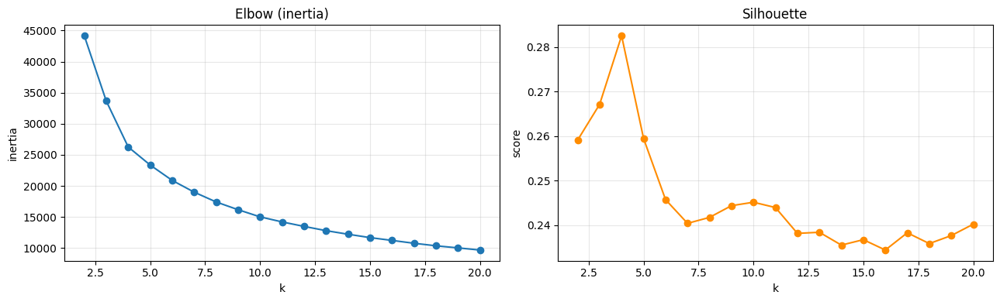

Best k by silhouette = 4 (score=0.283)
K-Means k=4 | silhouette=0.283


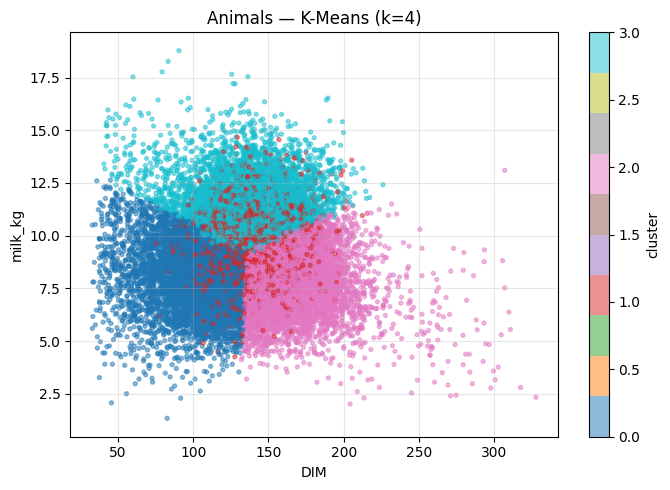

,milk_kg,DIM,parity,size
cluster,,,,
0,8.063,104.899,1.829,24343
1,9.331,137.487,6.237,18361
2,7.945,163.883,2.045,25493
3,11.284,135.346,2.594,22335


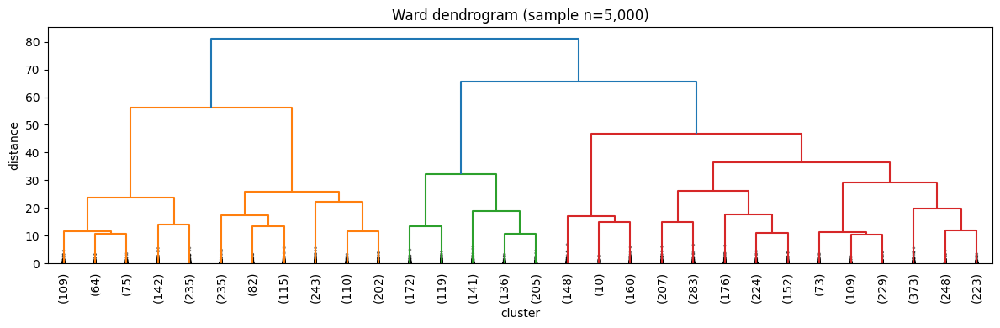

Hierarchical k=4 | silhouette=0.214 (on sample)


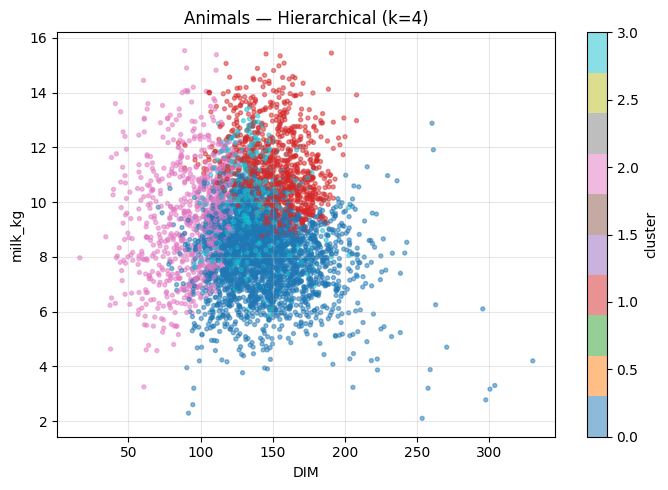

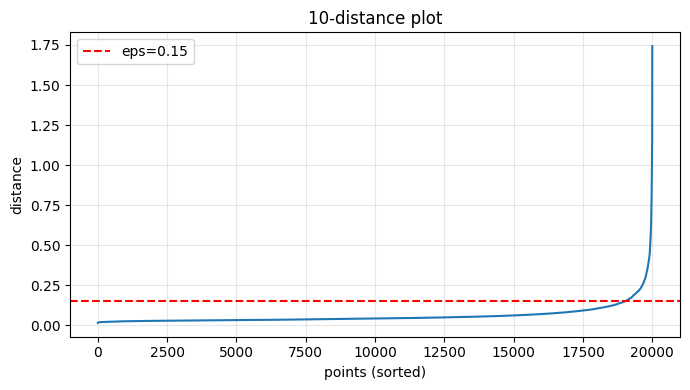

DBSCAN eps=0.15 | clusters=7, noise=3.3%


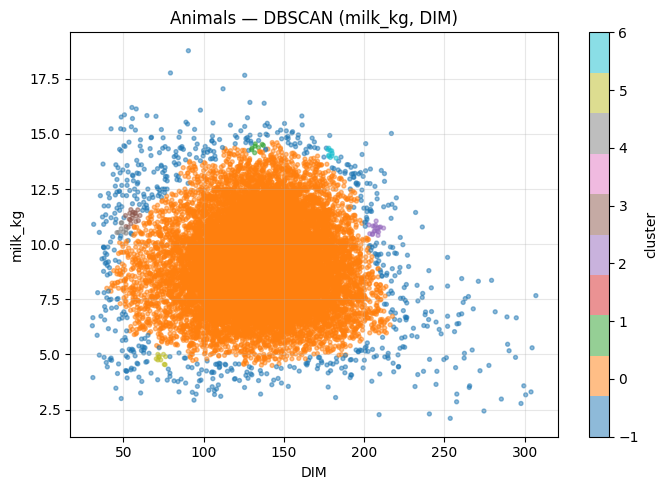

In [6]:
# --- Level 1 (per animal): diagnostics + the three methods ---
X_animal, _ = scale_features(df_animal, animal_feats)
best_k_animal = kmeans_diagnostics(X_animal, k_range=range(2, 21)) or 4

labels_km = run_kmeans(X_animal, best_k_animal)
cluster_scatter(df_animal, labels_km, f'Animals — K-Means (k={best_k_animal})')
display(profile_clusters(df_animal, labels_km, animal_feats))

idx_h, labels_h = run_hierarchical(X_animal, best_k_animal)
cluster_scatter(df_animal.iloc[idx_h].reset_index(drop=True), labels_h,
                f'Animals — Hierarchical (k={best_k_animal})')

# DBSCAN on CONTINUOUS traits only (parity is discrete and would just slice by band).
X_animal_dbs, _ = scale_features(df_animal, ['milk_kg', 'DIM'])
idx_d, labels_d = run_dbscan(X_animal_dbs)
cluster_scatter(df_animal.iloc[idx_d].reset_index(drop=True), labels_d,
                'Animals — DBSCAN (milk_kg, DIM)')

> The per-lactation and per-record levels reuse the exact same helpers — swap `df_animal`/`animal_feats`
> for `df_lact`/`lact_feats` or `df_record`/`record_feats`. **Baseline result:** clustering all three
> traits at once only reproduces high/medium/low producer **bands** — and with three features you still
> cannot see *which* pair actually separates them. That is the motivation for Part 2: cluster **two real
> features at a time**, so the scatter *is* the feature space.

---
# Part 2 — No-PCA feature-pair clustering

Instead of PCA, cluster on **exactly two original features at a time**: the 2-D scatter *is* the real
feature space, so every cluster boundary is read directly in trait units. Sweep all pairs among the
seven traits, rank by silhouette, and inspect the cleanest.

In [7]:
FEATURES = ['DIM', 'parity', 'AFC', 'protein_p', 'fat_p', 'SCS', 'milk_kg']
PAIRS = list(combinations(FEATURES, 2))

dpair = df.dropna(subset=FEATURES)
animal_traits = (dpair.groupby('Animal_ID')
                 .agg(milk_kg=('milk_kg', 'mean'), DIM=('DIM', 'mean'), parity=('parity', 'max'),
                      AFC=('AFC', 'min'), protein_p=('protein_p', 'mean'), fat_p=('fat_p', 'mean'),
                      SCS=('SCS', 'mean'), n_records=('milk_kg', 'size'))
                 .reset_index())
print(f'{len(PAIRS)} feature pairs | per-animal table: {len(animal_traits):,} rows')

21 feature pairs | per-animal table: 90,532 rows


In [8]:
def best_k_for_pair(X, k_range=range(2, 9), sample=20000):
    Xs = X if len(X) <= sample else X[np.random.choice(len(X), sample, replace=False)]
    sils = [silhouette_score(Xs, KMeans(k, random_state=RANDOM_STATE, n_init=10).fit_predict(Xs))
            for k in k_range]
    return list(k_range)[int(np.argmax(sils))], max(sils)

def cluster_pair(frame, fa, fb, k=None, ax=None, plot_sample=30000):
    """K-Means on the pair (fa, fb); scatter on the real axes + centroids. Returns (labels, sil, profile)."""
    feats = [fa, fb]
    scaler = StandardScaler()
    X = scaler.fit_transform(frame[feats].values)
    if k is None:
        k, _ = best_k_for_pair(X)
    km = KMeans(k, random_state=RANDOM_STATE, n_init=10).fit(X)
    labels, sil = km.labels_, sil_sampled(X, km.labels_)
    centroids = scaler.inverse_transform(km.cluster_centers_)
    if ax is None:
        _, ax = plt.subplots(figsize=(7, 5))
    idx = np.arange(len(frame))
    if len(idx) > plot_sample:
        idx = np.random.choice(idx, plot_sample, replace=False)
    ax.scatter(frame[fa].values[idx], frame[fb].values[idx], c=labels[idx], cmap='tab10', s=8, alpha=0.45)
    ax.scatter(centroids[:, 0], centroids[:, 1], c='black', marker='X', s=180,
               edgecolor='white', linewidth=1.5, zorder=5)
    ax.set(xlabel=fa, ylabel=fb, title=f'{fa} vs {fb}  (k={k}, sil={sil:.2f})'); ax.grid(alpha=0.3)
    prof = frame.assign(cluster=labels).groupby('cluster')[feats].mean()
    prof['size'] = frame.assign(cluster=labels).groupby('cluster').size()
    return labels, sil, prof

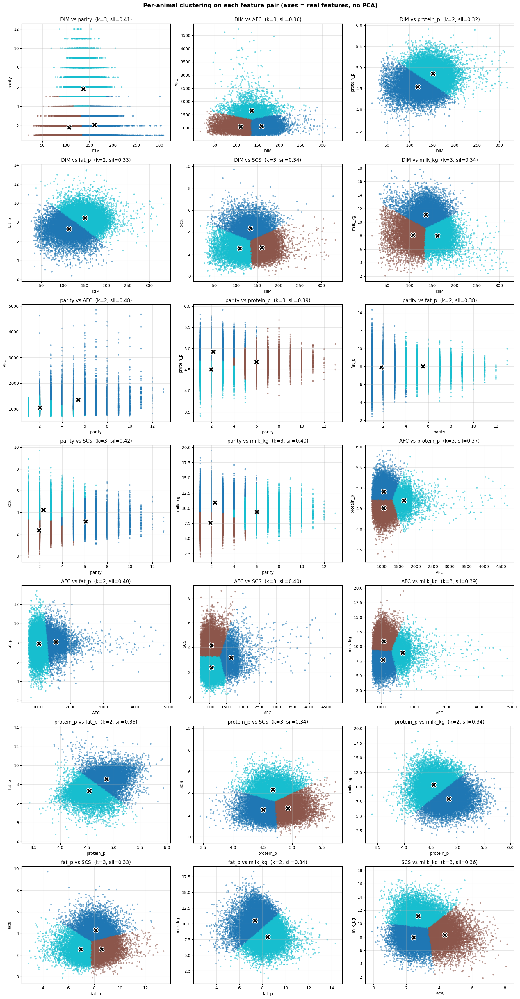

,feature_pair,silhouette
0,parity + AFC,0.479
1,parity + SCS,0.421
2,DIM + parity,0.409
3,AFC + SCS,0.405
4,parity + milk_kg,0.400
5,AFC + fat_p,0.396
6,parity + protein_p,0.390
7,AFC + milk_kg,0.388
8,parity + fat_p,0.382
9,AFC + protein_p,0.374


In [9]:
# Per-animal sweep of every feature pair (axes = real features, no PCA)
nrow = int(np.ceil(len(PAIRS) / 3))
fig, axes = plt.subplots(nrow, 3, figsize=(18, 5 * nrow))
results_animal = {}
for ax, (fa, fb) in zip(axes.ravel(), PAIRS):
    labels, sil, prof = cluster_pair(animal_traits, fa, fb, ax=ax)
    results_animal[(fa, fb)] = (labels, sil, prof)
for ax in axes.ravel()[len(PAIRS):]:
    ax.axis('off')
fig.suptitle('Per-animal clustering on each feature pair (axes = real features, no PCA)',
             fontsize=14, fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.98]); plt.show()

rank = (pd.DataFrame([(f'{a} + {b}', s) for (a, b), (_, s, _) in results_animal.items()],
                     columns=['feature_pair', 'silhouette'])
          .sort_values('silhouette', ascending=False).reset_index(drop=True))
display(rank)

> **Caveat that motivates Part 3:** the top pairs all *include* `parity` (or `AFC`, which tracks it).
> Because `parity` is a discrete integer, K-Means trivially cuts between its columns and silhouette
> rewards that — it is a **discreteness artifact**, not biology.

---
# Part 3 — Removing the parity confound

Stratify by parity (1, 2, 3+) and cluster the two genuinely continuous traits `milk_kg × DIM`
*within* each stratum. If each stratum is still one blob (K-Means silhouette stays low, DBSCAN
returns a single dense cluster), parity was never hiding real production groups → **continuum**.

parity_stratum
1     539336
2     398931
3+    693143
Name: count, dtype: int64


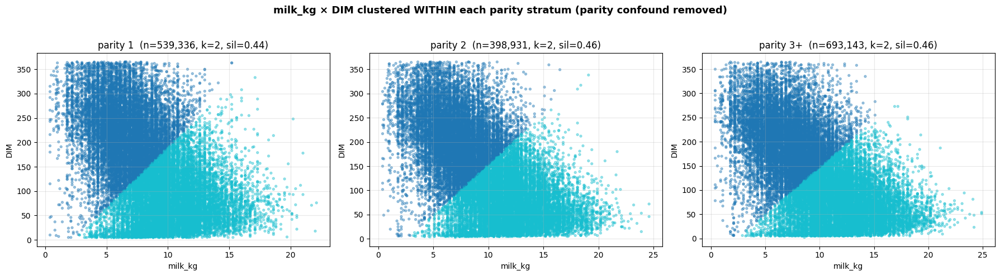

,parity_stratum,n,best_k,silhouette
0,1,539336,2,0.444
1,2,398931,2,0.461
2,3+,693143,2,0.457


In [10]:
strat = df.dropna(subset=['parity', 'DIM', 'milk_kg']).copy()
strat['parity_stratum'] = np.where(strat['parity'] >= 3, '3+', strat['parity'].astype(int).astype(str))
STRATA, CONT_FEATS = ['1', '2', '3+'], ['milk_kg', 'DIM']
print(strat['parity_stratum'].value_counts().reindex(STRATA))

# K-Means within each stratum
fig, axes = plt.subplots(1, 3, figsize=(18, 5)); summary = []
for ax, s in zip(axes, STRATA):
    sub = strat[strat['parity_stratum'] == s]
    X = StandardScaler().fit_transform(sub[CONT_FEATS].values)
    k, _ = best_k_for_pair(X)
    km = KMeans(k, random_state=RANDOM_STATE, n_init=10).fit(X)
    sil = sil_sampled(X, km.labels_)
    idx = np.random.choice(len(sub), min(30000, len(sub)), replace=False)
    ax.scatter(sub['milk_kg'].values[idx], sub['DIM'].values[idx], c=km.labels_[idx], cmap='tab10', s=8, alpha=0.4)
    ax.set(xlabel='milk_kg', ylabel='DIM', title=f'parity {s}  (n={len(sub):,}, k={k}, sil={sil:.2f})'); ax.grid(alpha=0.3)
    summary.append({'parity_stratum': s, 'n': len(sub), 'best_k': k, 'silhouette': round(sil, 3)})
fig.suptitle('milk_kg × DIM clustered WITHIN each parity stratum (parity confound removed)',
             fontsize=13, fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.95]); plt.show()
display(pd.DataFrame(summary))

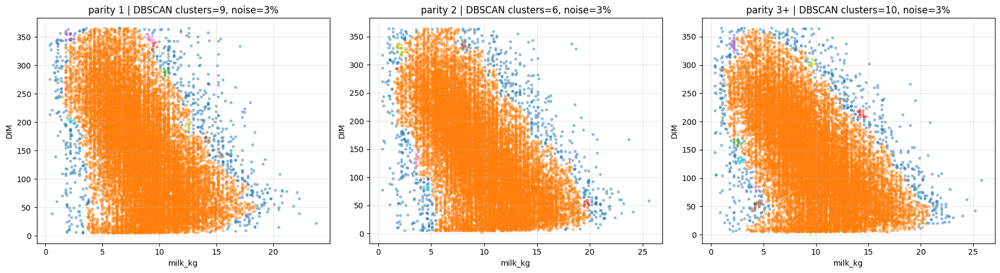

,parity_stratum,dbscan_clusters,noise_frac
0,1,9,0.030
1,2,6,0.031
2,3+,10,0.029


In [11]:
# DBSCAN density check within each stratum: one dense cluster per stratum => continuum
fig, axes = plt.subplots(1, 3, figsize=(18, 5)); dbs = []
for ax, s in zip(axes, STRATA):
    sub = strat[strat['parity_stratum'] == s]
    X = StandardScaler().fit_transform(sub[CONT_FEATS].values)
    idx = np.arange(len(X)) if len(X) <= 20000 else np.random.choice(len(X), 20000, replace=False)
    Xs = X[idx]
    nn = NearestNeighbors(n_neighbors=10, n_jobs=N_JOBS).fit(Xs)
    eps = np.percentile(np.sort(nn.kneighbors(Xs)[0][:, -1]), 95)
    lab = DBSCAN(eps=eps, min_samples=10, n_jobs=N_JOBS).fit_predict(Xs)
    n_clusters = len(set(lab)) - (1 if -1 in lab else 0)
    ax.scatter(sub['milk_kg'].values[idx], sub['DIM'].values[idx], c=lab, cmap='tab10', s=8, alpha=0.4)
    ax.set(xlabel='milk_kg', ylabel='DIM', title=f'parity {s} | DBSCAN clusters={n_clusters}, noise={(lab==-1).mean():.0%}')
    ax.grid(alpha=0.3)
    dbs.append({'parity_stratum': s, 'dbscan_clusters': n_clusters, 'noise_frac': round((lab == -1).mean(), 3)})
plt.tight_layout(); plt.show()
display(pd.DataFrame(dbs))

---
# Part 4 — Season & climate feature pairs

Extend the no-PCA pairs with **climate** (THI / Temperature / Humidity, merged per farm/test-date) and
a **summer/winter split**. Each scatter is coloured by season with a per-season regression line and
Pearson `r`, so the *effect of season* on every relationship is visible directly. `milk_kg` is always on Y.

In [12]:
TRAITS   = ['DIM', 'parity', 'AFC', 'protein_p', 'fat_p', 'SCS', 'milk_kg']   # milk_kg last -> Y axis
CLIMATE  = {'THI': 'THI_1_max', 'Temperature': 'temperature_max', 'Humidity': 'humidity_avg'}
TRAITS_Y = ['milk_kg', 'DIM', 'parity', 'AFC', 'protein_p', 'fat_p', 'SCS']
WARM_MONTHS   = {4, 5, 6, 7, 8, 9}         # warm half vs cold half (edit to strict summer {6,7,8,9})
SEASON_COLORS = {'summer': '#d62728', 'winter': '#1f77b4'}
PAIRS_A = list(combinations(TRAITS, 2))
PAIRS_B = [(c, t) for c in CLIMATE for t in TRAITS_Y]

# Build the climate-merged, season-labelled per-record frame
dfx = df.dropna(subset=['dtt']).copy()
dfx['farm']   = dfx['Farm_Code'].astype(str).str.replace(r'\.0$', '', regex=True)
dfx['date']   = pd.to_datetime(dfx['dtt'], errors='coerce')
dfx = dfx.dropna(subset=['date'])
dfx['month']  = dfx['date'].dt.month
dfx['dstr']   = dfx['date'].dt.strftime('%Y-%m-%d')
dfx['season'] = np.where(dfx['month'].isin(WARM_MONTHS), 'summer', 'winter')

Wx = load_farm_weather(CLIMATE.values()).rename(columns={v: k for k, v in CLIMATE.items()})
_dups = Wx.duplicated(['farm', 'dstr']).sum()
print(f'weather dup (farm,date) keys: {_dups} -> {"OK" if _dups == 0 else "WILL INFLATE THE MERGE"}')
_n0 = len(dfx); dfx = dfx.merge(Wx, on=['farm', 'dstr'], how='left')
print(f'merge rows {_n0:,} -> {len(dfx):,} {"OK no inflation" if len(dfx) == _n0 else "INFLATED!"}')
print(f'Climate matched on {dfx[list(CLIMATE)].notna().all(axis=1).mean():.0%} of records')
print(dfx['season'].value_counts())

weather dup (farm,date) keys: 0 -> OK
merge rows 1,631,410 -> 1,631,410 OK no inflation
Climate matched on 100% of records
season
summer    817900
winter    813510
Name: count, dtype: int64


In [13]:
def season_scatter(frame, fx, fy, ax, sample=12000):
    """Scatter fy vs fx coloured by season, per-season regression + Pearson r. Returns {season: r}."""
    sub = frame[[fx, fy, 'season']].dropna(); rs = {}
    for s in ['winter', 'summer']:
        d = sub[sub['season'] == s]
        if len(d) < 3 or d[fx].std() == 0 or d[fy].std() == 0:
            rs[s] = np.nan; continue
        r = d[fx].corr(d[fy]); rs[s] = r
        dd = d.sample(min(sample, len(d)), random_state=RANDOM_STATE)
        ax.scatter(dd[fx], dd[fy], s=6, alpha=0.20, color=SEASON_COLORS[s], label=f'{s}: r={r:+.2f}')
        slope, intercept = np.polyfit(d[fx], d[fy], 1)
        xs = np.linspace(d[fx].quantile(0.01), d[fx].quantile(0.99), 50)
        ax.plot(xs, intercept + slope * xs, color=SEASON_COLORS[s], lw=2.2)
    ax.set(xlabel=fx, ylabel=fy, title=f'{fy} vs {fx}'); ax.legend(fontsize=7, markerscale=2.5); ax.grid(alpha=0.3)
    return rs

def annot_heatmap(ax, M, title, vlim=1.0, cmap='RdBu_r'):
    im = ax.imshow(M.values, cmap=cmap, vmin=-vlim, vmax=vlim, aspect='auto')
    ax.set_xticks(range(M.shape[1])); ax.set_xticklabels(M.columns, rotation=45, ha='right', fontsize=8)
    ax.set_yticks(range(M.shape[0])); ax.set_yticklabels(M.index, fontsize=8)
    for i in range(M.shape[0]):
        for j in range(M.shape[1]):
            v = M.values[i, j]
            if not np.isnan(v):
                ax.text(j, i, f'{v:.2f}', ha='center', va='center', fontsize=7,
                        color='white' if abs(v) > vlim * 0.6 else 'black')
    ax.set_title(title, fontsize=11); return im

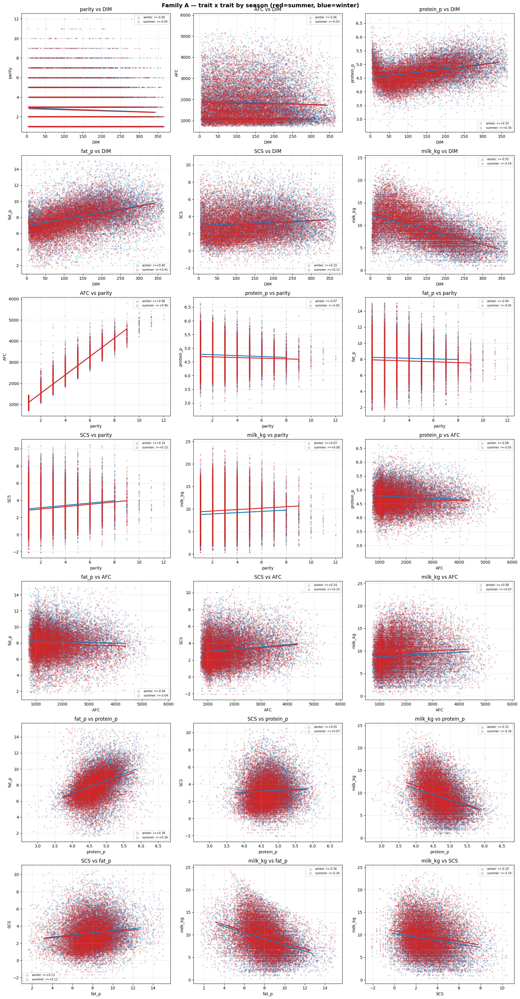

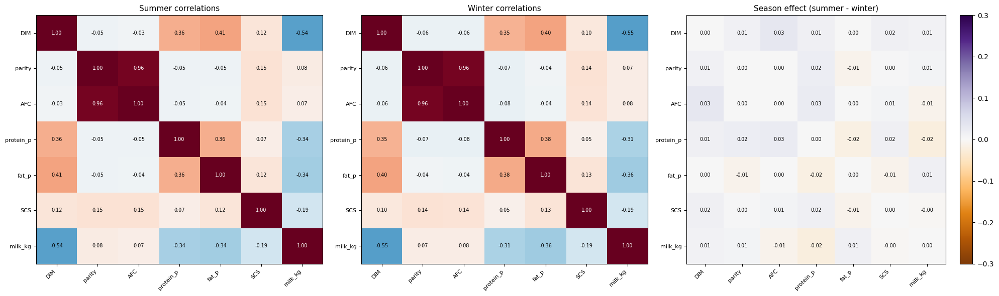

In [14]:
# Family A — trait x trait by season, + per-season correlation matrices and the season difference
nrow = int(np.ceil(len(PAIRS_A) / 3))
fig, axes = plt.subplots(nrow, 3, figsize=(18, 5 * nrow)); rA = {}
for ax, (fx, fy) in zip(axes.ravel(), PAIRS_A):
    rA[(fx, fy)] = season_scatter(dfx, fx, fy, ax)
for ax in axes.ravel()[len(PAIRS_A):]:
    ax.axis('off')
fig.suptitle('Family A — trait x trait by season (red=summer, blue=winter)', fontsize=14, fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.99]); plt.show()

Csum, Cwin = dfx[dfx.season == 'summer'][TRAITS].corr(), dfx[dfx.season == 'winter'][TRAITS].corr()
fig, ax = plt.subplots(1, 3, figsize=(20, 6))
annot_heatmap(ax[0], Csum, 'Summer correlations'); annot_heatmap(ax[1], Cwin, 'Winter correlations')
im = annot_heatmap(ax[2], Csum - Cwin, 'Season effect (summer - winter)', vlim=0.3, cmap='PuOr')
fig.colorbar(im, ax=ax[2], fraction=0.046); plt.tight_layout(); plt.show()

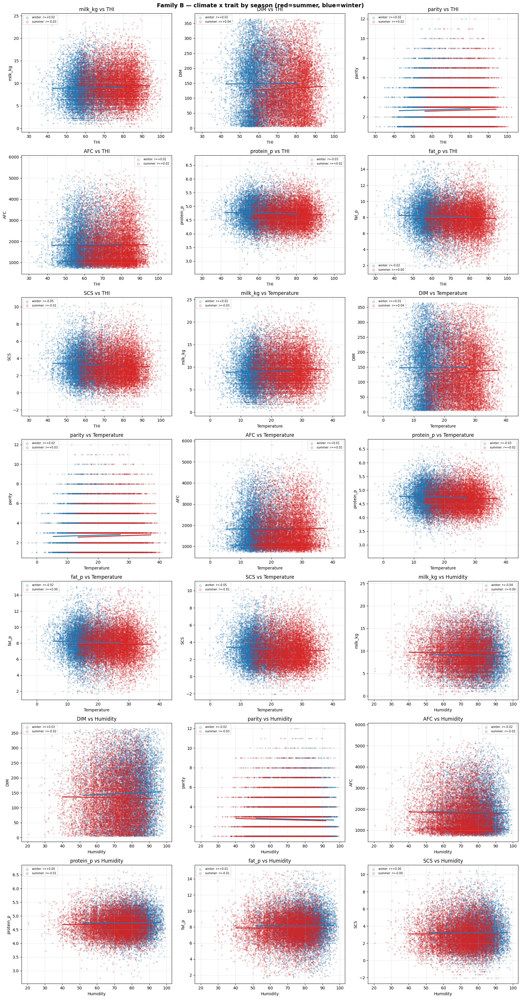

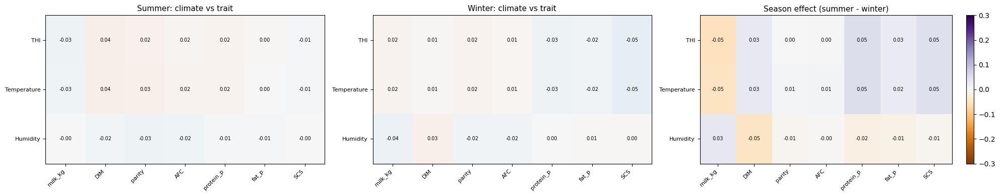

In [15]:
# Family B — climate x trait by season, + climate-vs-trait correlation per season
nrow = int(np.ceil(len(PAIRS_B) / 3))
fig, axes = plt.subplots(nrow, 3, figsize=(18, 5 * nrow)); rB = {}
for ax, (fx, fy) in zip(axes.ravel(), PAIRS_B):
    rB[(fx, fy)] = season_scatter(dfx, fx, fy, ax)
for ax in axes.ravel()[len(PAIRS_B):]:
    ax.axis('off')
fig.suptitle('Family B — climate x trait by season (red=summer, blue=winter)', fontsize=14, fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.99]); plt.show()

def climate_corr(frame):
    return pd.DataFrame({t: [frame[c].corr(frame[t]) for c in CLIMATE] for t in TRAITS_Y}, index=list(CLIMATE))
Bsum, Bwin = climate_corr(dfx[dfx.season == 'summer']), climate_corr(dfx[dfx.season == 'winter'])
fig, ax = plt.subplots(1, 3, figsize=(20, 4))
annot_heatmap(ax[0], Bsum, 'Summer: climate vs trait', vlim=0.6)
annot_heatmap(ax[1], Bwin, 'Winter: climate vs trait', vlim=0.6)
im = annot_heatmap(ax[2], Bsum - Bwin, 'Season effect (summer - winter)', vlim=0.3, cmap='PuOr')
fig.colorbar(im, ax=ax[2], fraction=0.046); plt.tight_layout(); plt.show()

In [16]:
# Which relationships depend most on season? Rank by |r_summer - r_winter|
rows = []
for fam, d in [('A trait-trait', rA), ('B climate-trait', rB)]:
    for (fx, fy), r in d.items():
        rows.append({'family': fam, 'pair': f'{fy} vs {fx}',
                     'r_summer': r.get('summer', np.nan), 'r_winter': r.get('winter', np.nan),
                     'abs_change': abs(r.get('summer', np.nan) - r.get('winter', np.nan))})
display(pd.DataFrame(rows).sort_values('abs_change', ascending=False).head(15).round(3).reset_index(drop=True))

,family,pair,r_summer,r_winter,abs_change
0,B climate-trait,milk_kg vs THI,-0.032,0.022,0.053
1,B climate-trait,protein_p vs Temperature,0.022,-0.029,0.051
2,B climate-trait,protein_p vs THI,0.022,-0.029,0.050
3,B climate-trait,milk_kg vs Temperature,-0.027,0.022,0.049
4,B climate-trait,DIM vs Humidity,-0.016,0.030,0.046
5,B climate-trait,SCS vs Temperature,-0.008,-0.054,0.046
6,B climate-trait,SCS vs THI,-0.008,-0.054,0.046
7,B climate-trait,milk_kg vs Humidity,-0.004,-0.036,0.031
8,A trait-trait,AFC vs DIM,-0.033,-0.064,0.031
9,B climate-trait,DIM vs THI,0.037,0.007,0.030


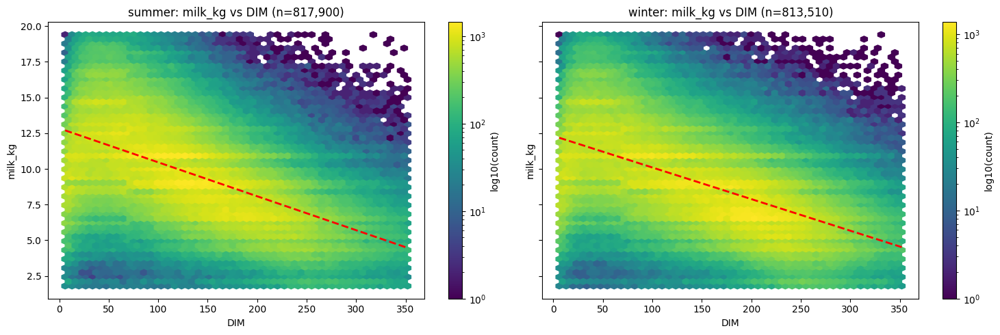

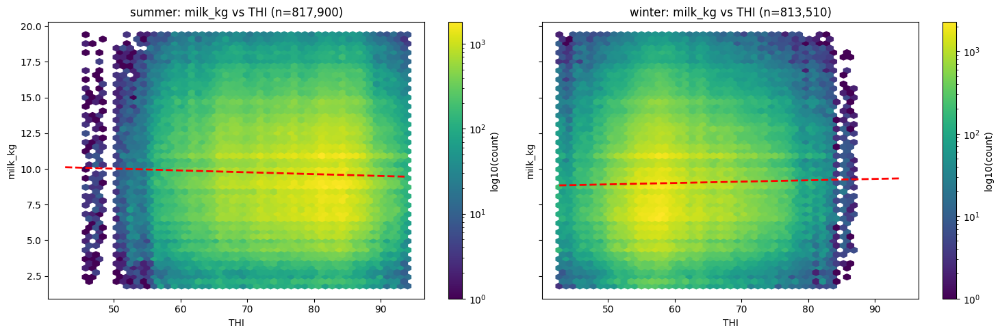

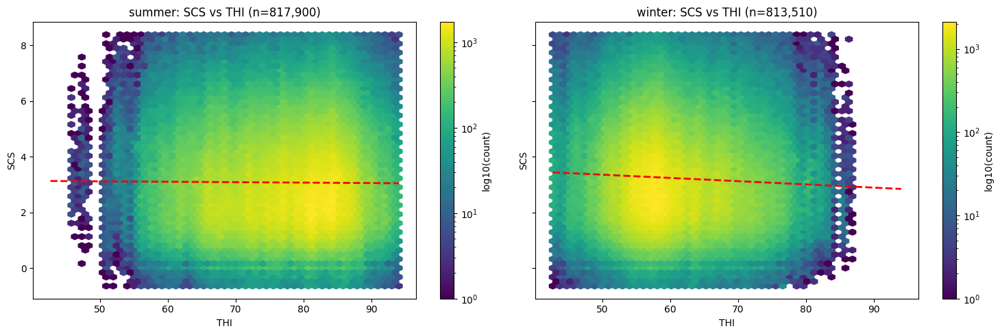

In [17]:
# Cloud density: per-season 2-D contours (the scatters are heavily overplotted) + hexbin drill-down
def _smooth(H, passes=1):
    for _ in range(passes):
        P = np.pad(H, 1, mode='edge')
        H = (P[:-2,:-2]+P[:-2,1:-1]+P[:-2,2:]+P[1:-1,:-2]+P[1:-1,1:-1]+P[1:-1,2:]+P[2:,:-2]+P[2:,1:-1]+P[2:,2:])/9.0
    return H

def season_density(frame, fx, fy, ax, bins=60, sample=150000, levels=(0.1, 0.3, 0.6, 0.9)):
    from matplotlib.lines import Line2D
    sub = frame[[fx, fy, 'season']].dropna()
    xr = (sub[fx].quantile(0.005), sub[fx].quantile(0.995))
    yr = (sub[fy].quantile(0.005), sub[fy].quantile(0.995))
    if xr[0] == xr[1] or yr[0] == yr[1]:
        ax.set_title(f'{fy} vs {fx} (no spread)'); return
    for s in ['winter', 'summer']:
        d = sub[sub['season'] == s]
        if len(d) < 50: continue
        if len(d) > sample: d = d.sample(sample, random_state=RANDOM_STATE)
        H, xe, ye = np.histogram2d(d[fx], d[fy], bins=bins, range=[xr, yr])
        H = _smooth(H.T, passes=2)
        if H.max() <= 0: continue
        xc, yc = (xe[:-1] + xe[1:]) / 2, (ye[:-1] + ye[1:]) / 2
        ax.contour(xc, yc, H / H.max(), levels=list(levels), colors=SEASON_COLORS[s], linewidths=1.1, alpha=0.85)
        slope, intercept = np.polyfit(d[fx], d[fy], 1)
        ax.plot(np.linspace(*xr, 50), intercept + slope * np.linspace(*xr, 50), color=SEASON_COLORS[s], lw=2, ls='--')
    ax.legend([Line2D([0], [0], color=SEASON_COLORS['summer']), Line2D([0], [0], color=SEASON_COLORS['winter'])],
              ['summer', 'winter'], fontsize=7)
    ax.set(xlabel=fx, ylabel=fy, xlim=xr, ylim=yr, title=f'{fy} vs {fx}'); ax.grid(alpha=0.3)

def pair_hexbin(frame, fx, fy, gridsize=50):
    sub = frame[[fx, fy, 'season']].dropna()
    xr = (sub[fx].quantile(0.005), sub[fx].quantile(0.995)); yr = (sub[fy].quantile(0.005), sub[fy].quantile(0.995))
    fig, axes = plt.subplots(1, 2, figsize=(15, 5), sharex=True, sharey=True)
    for ax, s in zip(axes, ['summer', 'winter']):
        d = sub[sub['season'] == s]
        hb = ax.hexbin(d[fx], d[fy], gridsize=gridsize, cmap='viridis', mincnt=1, bins='log',
                       extent=[xr[0], xr[1], yr[0], yr[1]])
        fig.colorbar(hb, ax=ax, label='log10(count)')
        slope, intercept = np.polyfit(d[fx], d[fy], 1)
        ax.plot(np.linspace(*xr, 50), intercept + slope * np.linspace(*xr, 50), 'r--', lw=2)
        ax.set(xlabel=fx, ylabel=fy, title=f'{s}: {fy} vs {fx} (n={len(d):,})')
    plt.tight_layout(); plt.show()

pair_hexbin(dfx, 'DIM', 'milk_kg')   # the lactation-curve cloud
pair_hexbin(dfx, 'THI', 'milk_kg')   # heat vs yield
pair_hexbin(dfx, 'THI', 'SCS')       # heat vs udder health

---
# Part 5 — Curve-shape clustering (the real structure)

Point-trait clustering was a dead end (Parts 1–3). The structure that *does* exist is the **shape of
each lactation curve** over time. Two complementary, literature-standard strategies:

1. **Model-free** — interpolate each lactation onto a common DIM grid, cluster the aligned curves.
2. **Wood's-feature** — fit `y(t)=a·t^b·e^(−ct)` per lactation, cluster the interpretable features
   (peak DIM, peak yield, persistency, 305-d yield).

In [18]:
# One lactation = one (Animal_ID, parity) time series of milk over DIM
lac = df.dropna(subset=['DIM', 'milk_kg']).copy()
lac['lact_id'] = lac['Animal_ID'].astype(str) + '_p' + lac['parity'].astype(int).astype(str)
lac = lac.sort_values(['lact_id', 'DIM'])
# Build each lactation's series ONCE — both methods below reuse it (the old version iterated the
# ~250k-group groupby twice).
groups = [(lid, g['DIM'].values, g['milk_kg'].values) for lid, g in lac.groupby('lact_id')]
print(f'{len(lac):,} records | {len(groups):,} lactations | {lac.Animal_ID.nunique():,} animals')

1,631,410 records | 244,913 lactations | 90,532 animals


108,327 well-sampled lactations kept (matrix (108327, 10))
Best k (level+shape) = 2, silhouette = 0.336


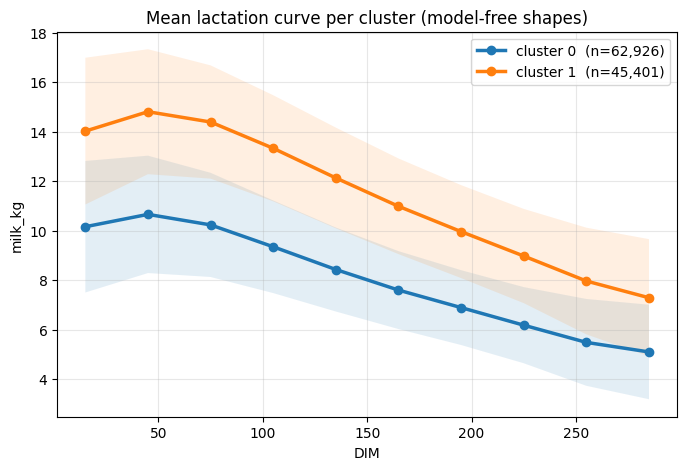

In [19]:
# Method 1 — whole-curve clustering (NOTE: this captures LEVEL + SHAPE; a shape-only check follows)
DIM_GRID = np.arange(15, 306, 30)              # 10 points across the 305-day lactation
MIN_POINTS, EARLY_BY, LATE_AFTER = 5, 60, 240  # require a well-spanned curve

curves, ids = [], []
for lid, d, m in groups:
    if len(d) >= MIN_POINTS and d.min() <= EARLY_BY and d.max() >= LATE_AFTER:
        curves.append(np.interp(DIM_GRID, d, m)); ids.append(lid)
C = np.array(curves); curve_ids = np.array(ids)
print(f'{len(C):,} well-sampled lactations kept (matrix {C.shape})')

Xc = StandardScaler().fit_transform(C)
samp = np.random.choice(len(Xc), min(20000, len(Xc)), replace=False)
ks = range(2, 9)
sils_shape = [silhouette_score(Xc[samp], KMeans(k, random_state=RANDOM_STATE, n_init=10).fit_predict(Xc[samp])) for k in ks]
K_SHAPE = list(ks)[int(np.argmax(sils_shape))]
print(f'Best k (level+shape) = {K_SHAPE}, silhouette = {max(sils_shape):.3f}')

lab_shape = KMeans(K_SHAPE, random_state=RANDOM_STATE, n_init=10).fit(Xc).labels_
fig, ax = plt.subplots(figsize=(8, 5))
for c in range(K_SHAPE):
    members = C[lab_shape == c]
    ax.plot(DIM_GRID, members.mean(0), 'o-', lw=2.5, label=f'cluster {c}  (n={len(members):,})')
    ax.fill_between(DIM_GRID, members.mean(0) - members.std(0), members.mean(0) + members.std(0), alpha=0.12)
ax.set(title='Mean lactation curve per cluster (model-free shapes)', xlabel='DIM', ylabel='milk_kg')
ax.legend(); ax.grid(alpha=0.3); plt.show()

Fitting Wood curves to 244,913 lactations...


Python(33671) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(33674) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(33675) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(33676) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(33677) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(33678) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(33679) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(33680) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


151,496 usable fits (62%). Median R2 = 0.84
Best k (Wood level+shape) = 3, silhouette = 0.299


,peak_DIM,peak_yield,persistency,yield_305,r2,n
cluster,,,,,,
0,23.160,12.020,6.110,"2,360.140",0.780,60024
1,72.720,11.620,7.750,"2,490.230",0.760,42549
2,34.360,16.870,6.380,"3,381.270",0.830,48923


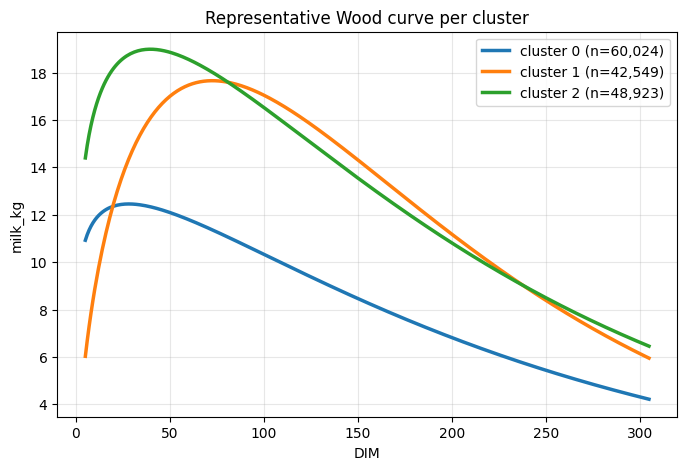

In [20]:
# Method 2 — Wood's-feature clustering (reuses `groups` and the shared fit_wood)
print(f'Fitting Wood curves to {len(groups):,} lactations...')
res = Parallel(n_jobs=N_JOBS, batch_size=512)(delayed(fit_wood)(d, m) for _, d, m in groups)
cols = ['a', 'b', 'c', 'peak_DIM', 'peak_yield', 'persistency', 'yield_305', 'r2']
feat = pd.DataFrame([(groups[i][0],) + r for i, r in enumerate(res) if r is not None], columns=['lact_id'] + cols)
print(f'{len(feat):,} usable fits ({len(feat)/len(groups):.0%}). Median R2 = {feat.r2.median():.2f}')
# Guard: a 0% fit rate means a BUG (e.g. an API removal swallowed by a broad except), not a real null.
assert len(feat) > 0, 'Wood fit produced 0 usable fits — this is a bug, not a result. Check fit_wood().'

# NOTE: peak_yield and yield_305 are LEVEL features -> these clusters are level+shape, not pure shape.
CLUSTER_FEATS = ['peak_DIM', 'peak_yield', 'persistency', 'yield_305']
Xw = StandardScaler().fit_transform(feat[CLUSTER_FEATS].values)
samp = np.random.choice(len(Xw), min(20000, len(Xw)), replace=False)
sils_wood = [silhouette_score(Xw[samp], KMeans(k, random_state=RANDOM_STATE, n_init=10).fit_predict(Xw[samp])) for k in ks]
K_FEAT = list(ks)[int(np.argmax(sils_wood))]
feat['cluster'] = KMeans(K_FEAT, random_state=RANDOM_STATE, n_init=10).fit_predict(Xw)
print(f'Best k (Wood level+shape) = {K_FEAT}, silhouette = {max(sils_wood):.3f}')

profile = feat.groupby('cluster')[CLUSTER_FEATS + ['r2']].mean()
profile['n'] = feat['cluster'].value_counts().sort_index()
display(profile.round(2))

means = feat.groupby('cluster')[['a', 'b', 'c']].mean(); tt = np.arange(5, 306)
fig, ax = plt.subplots(figsize=(8, 5))
for c in range(K_FEAT):
    a, b, cc = means.loc[c]
    ax.plot(tt, wood(tt, a, b, cc), lw=2.5, label=f'cluster {c} (n={int(profile.loc[c, "n"]):,})')
ax.set(title='Representative Wood curve per cluster', xlabel='DIM', ylabel='milk_kg'); ax.legend(); ax.grid(alpha=0.3); plt.show()

### Level vs shape — are the "curve types" actually just producer bands?

Both methods above mix **level** with **shape**: Method 1 standardizes each DIM-grid *column across
lactations* (so a uniformly high-yielding cow lands in a different cluster than a low one with the same
trajectory), and Method 2's features include `peak_yield` and `yield_305`, which are **levels**. Only
`peak_DIM` and `persistency` are pure shape.

That matters, because Parts 1–3 concluded production is a **continuum** — so if these "curve types" are
mostly high/medium/low producers, they are the same continuum re-sliced, not new structure. Test shape
**alone** two ways: row-normalize each curve (pure trajectory), and cluster the Wood features with the
level terms dropped.

level+shape (Method 1)      : k=2, silhouette=0.336
shape-ONLY (row-normalized) : k=2, silhouette=0.253

Mean yield (kg) per cluster — if the spread is large, the cluster IS the producer band:
  level+shape: [np.float64(8.0), np.float64(11.38)]   spread = 3.38 kg
  shape-only : [np.float64(9.37), np.float64(9.44)]   spread = 0.07 kg

ARI(level+shape, shape-only) = 0.002   (~0 => different groupings; level drives the original)

Wood level+shape (4 feats)            : k=3, silhouette=0.299
Wood shape-only (peak_DIM+persistency): k=3, silhouette=0.526


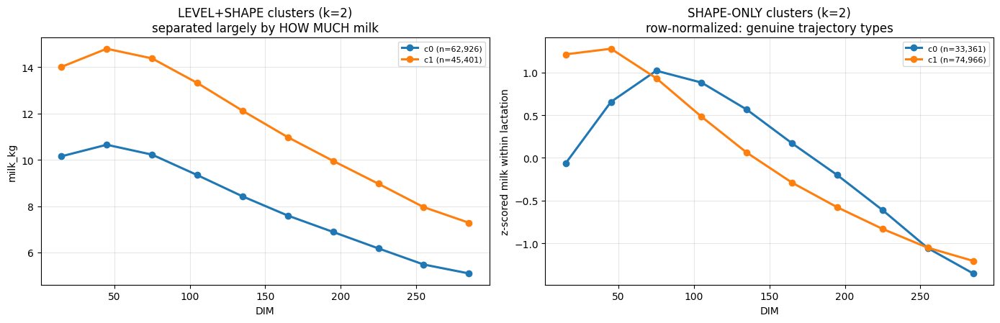

In [21]:
from sklearn.metrics import adjusted_rand_score

# (a) row-normalize each lactation -> pure trajectory, level removed
sd = C.std(1, keepdims=True)
Cz = (C - C.mean(1, keepdims=True)) / np.where(sd == 0, 1, sd)
sz = np.random.choice(len(Cz), min(20000, len(Cz)), replace=False)
sils_z = [silhouette_score(Cz[sz], KMeans(k, random_state=RANDOM_STATE, n_init=10).fit_predict(Cz[sz])) for k in ks]
K_Z = list(ks)[int(np.argmax(sils_z))]
lab_z = KMeans(K_Z, random_state=RANDOM_STATE, n_init=10).fit_predict(Cz)
print(f'level+shape (Method 1)      : k={K_SHAPE}, silhouette={max(sils_shape):.3f}')
print(f'shape-ONLY (row-normalized) : k={K_Z}, silhouette={max(sils_z):.3f}')

# Do the level+shape clusters simply sort lactations by average yield?
level = C.mean(1)
print('\nMean yield (kg) per cluster — if the spread is large, the cluster IS the producer band:')
for lab, name in [(lab_shape, 'level+shape'), (lab_z, 'shape-only ')]:
    m = sorted(level[lab == c].mean() for c in np.unique(lab))
    print(f'  {name}: {[round(v,2) for v in m]}   spread = {max(m)-min(m):.2f} kg')
print(f'\nARI(level+shape, shape-only) = {adjusted_rand_score(lab_shape, lab_z):.3f}'
      '   (~0 => different groupings; level drives the original)')

# (b) Wood features with the two LEVEL terms dropped
Xw_shape = StandardScaler().fit_transform(feat[['peak_DIM', 'persistency']].values)
ss = np.random.choice(len(Xw_shape), min(20000, len(Xw_shape)), replace=False)
sils_ws = [silhouette_score(Xw_shape[ss], KMeans(k, random_state=RANDOM_STATE, n_init=10).fit_predict(Xw_shape[ss])) for k in ks]
print(f"\nWood level+shape (4 feats)            : k={K_FEAT}, silhouette={max(sils_wood):.3f}")
print(f"Wood shape-only (peak_DIM+persistency): k={list(ks)[int(np.argmax(sils_ws))]}, silhouette={max(sils_ws):.3f}")

fig, ax = plt.subplots(1, 2, figsize=(14, 4.6))
for c in range(K_SHAPE):
    ax[0].plot(DIM_GRID, C[lab_shape == c].mean(0), 'o-', lw=2.2, label=f'c{c} (n={(lab_shape==c).sum():,})')
ax[0].set(title=f'LEVEL+SHAPE clusters (k={K_SHAPE})\nseparated largely by HOW MUCH milk',
          xlabel='DIM', ylabel='milk_kg'); ax[0].legend(fontsize=8); ax[0].grid(alpha=.3)
for c in range(K_Z):
    ax[1].plot(DIM_GRID, Cz[lab_z == c].mean(0), 'o-', lw=2.2, label=f'c{c} (n={(lab_z==c).sum():,})')
ax[1].set(title=f'SHAPE-ONLY clusters (k={K_Z})\nrow-normalized: genuine trajectory types',
          xlabel='DIM', ylabel='z-scored milk within lactation'); ax[1].legend(fontsize=8); ax[1].grid(alpha=.3)
plt.tight_layout(); plt.show()

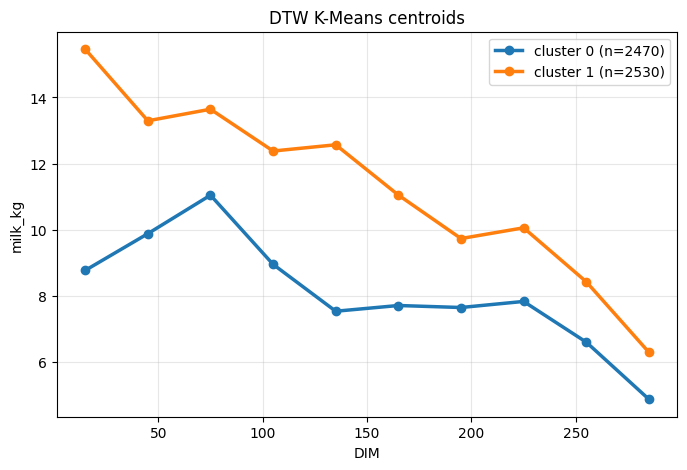

In [22]:
# Optional — DTW time-series K-Means (needs tslearn; safe to skip)
try:
    from tslearn.clustering import TimeSeriesKMeans
    from tslearn.utils import to_time_series_dataset
    sub = np.random.choice(len(C), min(5000, len(C)), replace=False)   # DTW is O(n^2 L^2); subsample
    dtw_km = TimeSeriesKMeans(n_clusters=K_SHAPE, metric='dtw', random_state=RANDOM_STATE, max_iter=10)
    dtw_lab = dtw_km.fit_predict(to_time_series_dataset(C[sub]))
    fig, ax = plt.subplots(figsize=(8, 5))
    for c in range(K_SHAPE):
        ax.plot(DIM_GRID, dtw_km.cluster_centers_[c].ravel(), 'o-', lw=2.5, label=f'cluster {c} (n={(dtw_lab==c).sum()})')
    ax.set(title='DTW K-Means centroids', xlabel='DIM', ylabel='milk_kg'); ax.legend(); ax.grid(alpha=0.3); plt.show()
except ImportError:
    print('tslearn not installed - skipping DTW. To enable: pip install tslearn')

---
# Part 6 — Linking curve types to heat & udder health (SCS)

The thesis payoff. Merge each test-day with its farm's **daily-max THI**, remove the season confound
with the **THI anomaly** (heat above the farm-month normal), then: (1) show the season confound,
(2) the clean effect on milk (a null) and on SCS (the real signal), (3) a within-animal
fixed-effects model, (4) an out-of-sample test for real heat-tolerance classes, and (5) the
heat→SCS slope across the Part-5 curve clusters.

In [23]:
# Build the heat/SCS table H (production + SCS + daily-max THI + anomaly + DIM/parity residual)
H = df.dropna(subset=['dtt', 'SCS']).copy()
H['lact_id'] = H['Animal_ID'].astype(str) + '_p' + H['parity'].astype(int).astype(str)
H['farm']  = H['Farm_Code'].astype(str).str.replace(r'\.0$', '', regex=True)
H['date']  = pd.to_datetime(H['dtt'], errors='coerce')
H['month'] = H['date'].dt.month
H['dstr']  = H['date'].dt.strftime('%Y-%m-%d')

Wt = load_farm_weather(['THI_1_max']).dropna()
H = H.merge(Wt, on=['farm', 'dstr'], how='left').dropna(subset=['THI_1_max'])
H['DIM_bin']  = (H['DIM'] // 10).astype('Int64')   # 10-day bins, matching Climate_Signal_Analysis
H['resid']    = H['milk_kg'] - H.groupby(['parity', 'DIM_bin'])['milk_kg'].transform('mean')   # remove DIM+parity
# FIX: SCS needs the SAME lactation-stage control as milk. SCS naturally rises through lactation, and
# heat exposure tracks lactation stage — so an uncontrolled heat->SCS slope is inflated. (In
# Climate_Signal_Analysis, DIM control HALVED the summer SCS effect and zeroed it full-year.)
H['scs_resid'] = H['SCS'] - H.groupby(['parity', 'DIM_bin'])['SCS'].transform('mean')
H['thi_anom'] = H['THI_1_max'] - H.groupby(['farm', 'month'])['THI_1_max'].transform('mean')    # remove season
print(f'H: {len(H):,} records | THI matched {H["THI_1_max"].notna().mean():.0%}')

H: 1,631,410 records | THI matched 100%


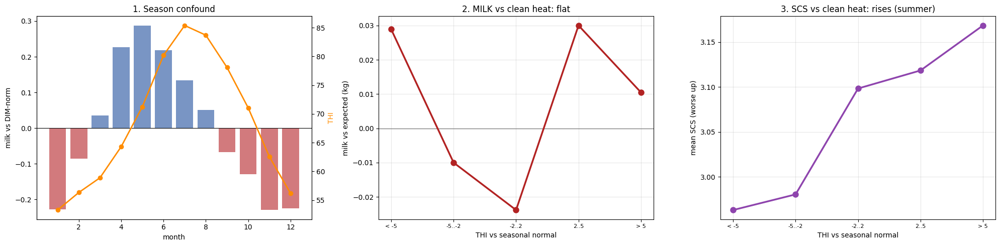

In [24]:
# 1. Season confound; 2. clean effect on MILK (flat) and SCS (rises, summer)
mo = H.groupby('month').agg(milk_resid=('resid', 'mean'), THI=('THI_1_max', 'mean'))
bins, labs = [-30, -5, -2, 2, 5, 30], ['< -5', '-5..-2', '-2..2', '2..5', '> 5']
H['anom_bin'] = pd.cut(H['thi_anom'], bins, labels=labs)
g = H.groupby('anom_bin', observed=True).agg(resid=('resid', 'mean'))
summer = H[H['month'].isin([6, 7, 8, 9])].copy()
summer['anom_bin'] = pd.cut(summer['thi_anom'], bins, labels=labs)
gs = summer.groupby('anom_bin', observed=True).agg(SCS=('SCS', 'mean'))

fig, ax = plt.subplots(1, 3, figsize=(20, 5))
ax[0].bar(mo.index, mo['milk_resid'], color=['#4c72b0' if v >= 0 else '#c44e52' for v in mo['milk_resid']], alpha=0.75)
ax0b = ax[0].twinx(); ax0b.plot(mo.index, mo['THI'], 'o-', color='darkorange', lw=2)
ax[0].axhline(0, color='k', lw=0.8); ax[0].set(title='1. Season confound', xlabel='month', ylabel='milk vs DIM-norm'); ax0b.set_ylabel('THI', color='darkorange')
ax[1].axhline(0, color='gray', lw=1); ax[1].plot(range(len(g)), g['resid'], 'o-', color='firebrick', lw=2.5, ms=8)
ax[1].set_xticks(range(len(g))); ax[1].set_xticklabels(g.index, fontsize=8)
ax[1].set(title='2. MILK vs clean heat: flat', xlabel='THI vs seasonal normal', ylabel='milk vs expected (kg)'); ax[1].grid(alpha=0.3)
ax[2].plot(range(len(gs)), gs['SCS'], 'o-', color='#8e44ad', lw=2.5, ms=8)
ax[2].set_xticks(range(len(gs))); ax[2].set_xticklabels(gs.index, fontsize=8)
ax[2].set(title='3. SCS vs clean heat: rises (summer)', xlabel='THI vs seasonal normal', ylabel='mean SCS (worse up)'); ax[2].grid(alpha=0.3)
plt.tight_layout(); plt.show()

Within-animal effect of excess heat (THI anomaly), per +10 THI:
  MILK  (DIM-controlled)      : -0.067 kg   p=3.6e-05
  SCS   (NO DIM control)      : +0.129      p=1.0e-08   <- inflated
  SCS   (DIM-controlled)      : +0.060      p=3.0e-03   <- honest
  -> DIM control changes the SCS effect by 53%


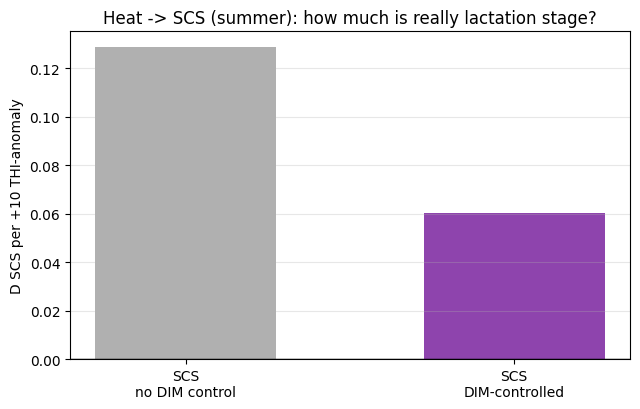

In [25]:
# 4. Within-animal fixed-effects effect sizes (farm-clustered SE).
# SCS is shown BOTH uncontrolled and DIM-controlled — the controlled one is the honest number.
b_milk, p_milk, _ = fe_slope(H, 'resid')
b_raw,  p_raw,  _ = fe_slope(summer, 'SCS')          # no lactation-stage control (inflated)
b_ctrl, p_ctrl, n = fe_slope(summer, 'scs_resid')    # DIM x parity controlled  <- report this
print('Within-animal effect of excess heat (THI anomaly), per +10 THI:')
print(f'  MILK  (DIM-controlled)      : {b_milk*10:+.3f} kg   p={p_milk:.1e}')
print(f'  SCS   (NO DIM control)      : {b_raw*10:+.3f}      p={p_raw:.1e}   <- inflated')
print(f'  SCS   (DIM-controlled)      : {b_ctrl*10:+.3f}      p={p_ctrl:.1e}   <- honest')
print(f'  -> DIM control changes the SCS effect by {abs(b_raw-b_ctrl)/max(abs(b_raw),1e-9)*100:.0f}%')

fig, ax = plt.subplots(figsize=(6.5, 4.2))
ax.bar(['SCS\nno DIM control', 'SCS\nDIM-controlled'], [b_raw*10, b_ctrl*10],
       color=['#b0b0b0', '#8e44ad'], width=.55)
ax.axhline(0, color='k', lw=1)
ax.set(title='Heat -> SCS (summer): how much is really lactation stage?', ylabel='D SCS per +10 THI-anomaly')
ax.grid(alpha=.3, axis='y'); plt.tight_layout(); plt.show()

In [26]:
# 5. Do real heat-tolerance CLASSES exist? Out-of-sample stability of each animal's heat slope.
H = H.sort_values(['Animal_ID', 'dstr']); H['half'] = H.groupby('Animal_ID').cumcount() % 2
def aslope(sub, x):
    xc = sub[x] - sub.groupby('Animal_ID')[x].transform('mean')
    yc = sub['resid'] - sub.groupby('Animal_ID')['resid'].transform('mean')
    num = (xc * yc).groupby(sub['Animal_ID']).sum(); den = (xc ** 2).groupby(sub['Animal_ID']).sum()
    cnt = sub.groupby('Animal_ID').size()
    return (num / den)[cnt >= 5].dropna()
sl_rawA, sl_rawB = aslope(H[H.half == 0], 'THI_1_max'), aslope(H[H.half == 1], 'THI_1_max')
cr = sl_rawA.index.intersection(sl_rawB.index)
sl_anA, sl_anB = aslope(H[H.half == 0], 'thi_anom'), aslope(H[H.half == 1], 'thi_anom')
ca = sl_anA.index.intersection(sl_anB.index)
print(f'OOS stability, raw THI (season-confounded): r = {sl_rawA[cr].corr(sl_rawB[cr]):+.3f}  (looks like a trait)')
print(f'OOS stability, clean THI anomaly:           r = {sl_anA[ca].corr(sl_anB[ca]):+.3f}  (~0 -> NOT a real trait)')
print('VERDICT: heat-tolerance classes are NOT identifiable; the stable split was calving-season.')

OOS stability, raw THI (season-confounded): r = +0.308  (looks like a trait)
OOS stability, clean THI anomaly:           r = -0.016  (~0 -> NOT a real trait)
VERDICT: heat-tolerance classes are NOT identifiable; the stable split was calving-season.


In [27]:
# 6. heat -> SCS slope ACROSS the Part-5 curve clusters (does curve type modify the SCS effect?)
Hc = summer.merge(feat[['lact_id', 'cluster']], on='lact_id', how='inner')
print('Within-animal heat -> SCS slope per curve cluster (summer), DIM-controlled:')
rows = []
for cl in sorted(Hc['cluster'].unique()):
    b, p, n   = fe_slope(Hc[Hc['cluster'] == cl], 'scs_resid')   # DIM-controlled (honest)
    br, _, _  = fe_slope(Hc[Hc['cluster'] == cl], 'SCS')         # uncontrolled, for contrast
    rows.append({'curve_cluster': cl, 'SCS_per_+10 (no ctrl)': round(br * 10, 3),
                 'SCS_per_+10 (DIM-ctrl)': round(b * 10, 3), 'p(ctrl)': p, 'n': n})
tab = pd.DataFrame(rows); display(tab)
spread = tab['SCS_per_+10 (DIM-ctrl)'].max() - tab['SCS_per_+10 (DIM-ctrl)'].min()
print(f'Spread across curve types = {spread:.3f}. If small/ns, heat raises SCS across ALL curve types')
print('-> there is no single heat-vulnerable udder-health type.')

Within-animal heat -> SCS slope per curve cluster (summer), DIM-controlled:


,curve_cluster,SCS_per_+10 (no ctrl),SCS_per_+10 (DIM-ctrl),p(ctrl),n
0,0,0.070,0.025,0.238,149635
1,1,0.090,0.047,0.042,105861
2,2,0.093,0.051,0.049,130196


Spread across curve types = 0.026. If small/ns, heat raises SCS across ALL curve types
-> there is no single heat-vulnerable udder-health type.


---
# Part 7 — Regional & farm structure: is geography a real grouping?

Parts 1–6 asked whether *animals* form groups. This part asks whether **farms and regions** do — and
whether that grouping recovers Italy's **North / Central / South** geography (ISTAT macro-areas).

The decisive trick is **feature blocks**: cluster the farms on their **climate** profile
(THI avg/max, heat-day fraction) and on their **production** profile (milk, fat, protein, SCS)
*separately*, then measure how well each recovers `macro_area` with the **Adjusted Rand Index**. That
separates two very different claims: *"the South is hotter"* (climate) vs *"southern buffalo are
different animals"* (production).

Then, one trait at a time (**no PCA**), we cluster the regions on each animal variable and ask whether
*any* of them carve Italy along N/C/S lines.

Then three further questions: do regions group by **how they respond to heat** (7.7), does the farm
structure **shift between summer and winter** (7.8), and is any **single trait** geographic at farm
level (7.9)?

*(Rebuilt from the removed pipeline's Stage 6 & 7. The per-region heat **forest plot** is not repeated
here — it lives in `Climate_Signal_Analysis.ipynb` Part 9 — but grouping regions into heat-response
**types** is a different question and is done below in 7.7.)*

In [28]:
from scipy.cluster.hierarchy import fcluster
from sklearn.metrics import adjusted_rand_score, davies_bouldin_score

# Part 7 needs Region + weather together, so it loads Final_Merged_Data (After_Processing has no THI).
MERGED = '../../Thesis_Data/Final_Data/Final_Merged_Data.csv'
reg_df = pd.read_csv(MERGED, usecols=['Farm_Code', 'Animal_ID', 'Region', 'parity', 'DIM', 'milk_kg',
                                      'fat_p', 'protein_p', 'SCS', 'ECM', 'AFC', 'THI_1_avg', 'THI_1_max', 'dtt'])
reg_df['month'] = pd.to_datetime(reg_df['dtt'], errors='coerce').dt.month
reg_df['AFC'] = pd.to_timedelta(reg_df['AFC'], errors='coerce').dt.days
reg_df = reg_df[(reg_df.milk_kg > 0) & (reg_df.DIM.between(1, 365))]

# macro_area = ISTAT North / Central / South & Islands
MACRO_AREA = {'Piemonte': 'North', 'Lombardia': 'North', 'Veneto': 'North',
              'Friuli Venezia Giulia': 'North', 'Emilia Romagna': 'North',
              'Toscana': 'Central', 'Umbria': 'Central', 'Marche': 'Central', 'Lazio': 'Central',
              'Abruzzo': 'South', 'Molise': 'South', 'Campania': 'South', 'Basilicata': 'South',
              'Puglia': 'South', 'Calabria': 'South', 'Sicilia': 'South'}
reg_df['macro_area'] = reg_df['Region'].map(MACRO_AREA)
# AFC_mo: stored AFC = age at the CURRENT calving, so each animal's MINIMUM ~ age at FIRST calving.
# (The pipeline had an exact `true_AFC_days`; this is the closest reconstruction from this file.)
reg_df['AFC_mo'] = reg_df.groupby('Animal_ID')['AFC'].transform('min') / 30.44
reg_df = reg_df.dropna(subset=['macro_area'])

def sil(X, lab): return round(silhouette_score(X, lab), 3) if len(set(lab)) > 1 else np.nan
def best_k_small(X, kr=range(2, 7)):
    b = (None, -1, None)
    for k in kr:
        if k >= len(X): break
        lab = KMeans(k, n_init=10, random_state=RANDOM_STATE).fit_predict(X)
        s = sil(X, lab)
        if s > b[1]: b = (k, s, lab)
    return b

print(f'{len(reg_df):,} records | {reg_df.Farm_Code.nunique()} farms | '
      f'{reg_df.Region.nunique()} regions | {reg_df.macro_area.nunique()} macro-areas')
cov = (reg_df.groupby(['macro_area', 'Region'])
       .agg(farms=('Farm_Code', 'nunique'), animals=('Animal_ID', 'nunique'), records=('milk_kg', 'size'))
       .reset_index().sort_values('records', ascending=False))
cov['rec_share_%'] = (100 * cov.records / cov.records.sum()).round(1)
print('\n7.1 Coverage — the panel is heavily South-weighted; small regions = noisy profiles:')
display(cov)

1,631,410 records | 316 farms | 16 regions | 3 macro-areas

7.1 Coverage — the panel is heavily South-weighted; small regions = noisy profiles:


,macro_area,Region,farms,animals,records,rec_share_%
12,South,Campania,179,50043,867442,53.200
0,Central,Lazio,91,24861,454309,27.800
14,South,Puglia,11,3219,65984,4.000
6,North,Lombardia,4,2668,58920,3.600
10,South,Basilicata,6,1992,42281,2.600
7,North,Piemonte,3,2108,42127,2.600
11,South,Calabria,4,1744,34416,2.100
5,North,Friuli Venezia Giulia,3,1075,22609,1.400
8,North,Veneto,4,1095,19120,1.200
15,South,Sicilia,4,864,9620,0.600


7.2 Region profiles:


,macro_area,farms,records,milk_kg,fat_p,protein_p,SCS,THI_avg,THI_max,heatday_frac,parity,AFC_mo
Region,,,,,,,,,,,,
Abruzzo,South,1,187,8.800,7.930,4.930,1.970,56.770,66.930,0.240,1.000,31.830
Basilicata,South,6,42281,10.170,8.130,4.780,3.600,58.010,68.040,0.270,2.670,34.220
Calabria,South,4,34416,9.500,7.970,4.610,3.190,62.340,68.620,0.240,2.820,34.630
Campania,South,179,867442,9.290,8.080,4.690,3.260,61.030,69.210,0.270,2.650,37.780
Emilia Romagna,North,1,395,8.480,7.850,4.620,3.260,56.570,65.020,0.230,2.700,39.160
Friuli Venezia Giulia,North,3,22609,9.440,7.920,4.560,2.720,56.030,62.780,0.130,2.900,39.690
Lazio,Central,91,454309,9.470,7.810,4.760,2.820,61.440,69.460,0.280,2.780,38.690
Lombardia,North,4,58920,8.460,8.540,4.750,3.580,56.440,64.570,0.200,2.590,34.480
Marche,Central,1,1812,8.620,7.680,4.660,2.630,61.250,68.970,0.250,2.540,38.770



7.3 Region clustering (10 well-sampled regions): ['Basilicata', 'Calabria', 'Campania', 'Friuli Venezia Giulia', 'Lazio', 'Lombardia', 'Piemonte', 'Puglia', 'Sicilia', 'Veneto']
  Ward k=2: silhouette=0.308  ARI vs macro_area=+0.449  sizes=[5, 5]
  Ward k=3: silhouette=0.31  ARI vs macro_area=+0.321  sizes=[5, 4, 1]
  Ward k=4: silhouette=0.315  ARI vs macro_area=+0.443  sizes=[5, 3, 1, 1]

  Ward k=3 vs macro_area:
macro_area  Central  North  South
region_cl                        
1                 1      0      4
2                 0      3      1
3                 0      1      0


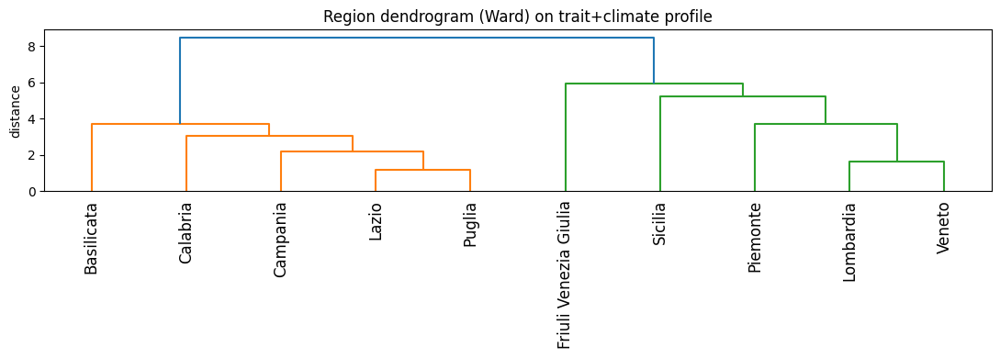

In [29]:
# 7.2 Region-level profiles (interpretable, no PCA) + 7.3 region clustering vs macro_area
def heatday_frac(s): return float((s >= 78).mean())      # THI_1_max >= 78 = buffalo heat-stress day

reg = (reg_df.groupby('Region')
       .agg(farms=('Farm_Code', 'nunique'), records=('milk_kg', 'size'),
            milk_kg=('milk_kg', 'mean'), fat_p=('fat_p', 'mean'), protein_p=('protein_p', 'mean'),
            SCS=('SCS', 'mean'), ECM=('ECM', 'mean'),
            THI_avg=('THI_1_avg', 'mean'), THI_max=('THI_1_max', 'mean'),
            parity=('parity', 'mean'), AFC_mo=('AFC_mo', 'mean'))
       .join(reg_df.groupby('Region')['THI_1_max'].apply(heatday_frac).rename('heatday_frac')))
reg['macro_area'] = reg_df.groupby('Region')['macro_area'].first()
CLUS_FEATS = ['milk_kg', 'fat_p', 'protein_p', 'SCS', 'THI_avg', 'THI_max', 'heatday_frac', 'parity', 'AFC_mo']
print('7.2 Region profiles:')
display(reg[['macro_area', 'farms', 'records'] + CLUS_FEATS].round(2))

regC = reg[(reg.farms >= 2) & (reg.records >= 5000)].copy()   # a 1-farm region is one herd, not a region
Xr = StandardScaler().fit_transform(regC[CLUS_FEATS])
Z = linkage(Xr, method='ward')
print(f'\n7.3 Region clustering ({len(regC)} well-sampled regions): {list(regC.index)}')
for k in (2, 3, 4):
    lab = fcluster(Z, k, criterion='maxclust')
    print(f'  Ward k={k}: silhouette={sil(Xr, lab)}  ARI vs macro_area={adjusted_rand_score(regC.macro_area, lab):+.3f}'
          f'  sizes={np.bincount(lab)[1:].tolist()}')
regC['region_cl'] = fcluster(Z, 3, criterion='maxclust')
print('\n  Ward k=3 vs macro_area:'); print(pd.crosstab(regC.region_cl, regC.macro_area).to_string())

plt.figure(figsize=(11, 4))
dendrogram(Z, labels=regC.index.tolist(), leaf_rotation=90)
plt.title('Region dendrogram (Ward) on trait+climate profile'); plt.ylabel('distance')
plt.tight_layout(); plt.show()

7.4 Farm-level clustering — 299 farms (>=200 records)


,block,best_k,silhouette,ARI_bestk_vs_macroarea,ARI_k3_vs_macroarea,DBI
0,full,3,0.163,0.074,0.074,1.979
1,climate,2,0.584,0.165,0.096,0.589
2,production,4,0.243,0.003,0.015,1.214


Read: high silhouette + higher ARI for CLIMATE than PRODUCTION => geography is a climate
gradient, not a production type.


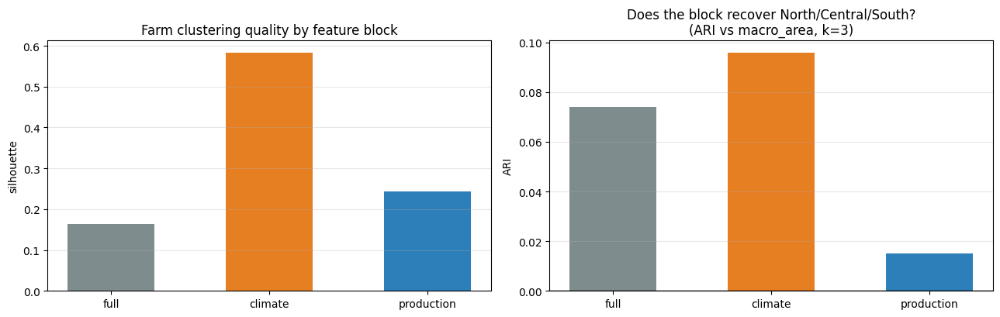

In [30]:
# 7.4 Farm-level clustering by FEATURE BLOCK — the decisive test.
# "The South is hotter" (climate) vs "southern buffalo are different animals" (production)?
farm = (reg_df.groupby('Farm_Code')
        .agg(records=('milk_kg', 'size'), milk_kg=('milk_kg', 'mean'), fat_p=('fat_p', 'mean'),
             protein_p=('protein_p', 'mean'), SCS=('SCS', 'mean'), THI_avg=('THI_1_avg', 'mean'),
             THI_max=('THI_1_max', 'mean'), parity=('parity', 'mean'), AFC_mo=('AFC_mo', 'mean'))
        .join(reg_df.groupby('Farm_Code')['THI_1_max'].apply(heatday_frac).rename('heatday_frac')))
farm['macro_area'] = reg_df.groupby('Farm_Code')['macro_area'].first()
farm = farm[farm.records >= 200].dropna()
print(f'7.4 Farm-level clustering — {len(farm)} farms (>=200 records)')

blocks = {'full':       CLUS_FEATS,
          'climate':    ['THI_avg', 'THI_max', 'heatday_frac'],
          'production': ['milk_kg', 'fat_p', 'protein_p', 'SCS']}
frows = []
for name, feats in blocks.items():
    X = StandardScaler().fit_transform(farm[feats])
    k, s, lab = best_k_small(X, range(2, 7))
    ari3 = adjusted_rand_score(farm.macro_area, KMeans(3, n_init=10, random_state=RANDOM_STATE).fit_predict(X))
    frows.append({'block': name, 'best_k': k, 'silhouette': round(s, 3),
                  'ARI_bestk_vs_macroarea': round(adjusted_rand_score(farm.macro_area, lab), 3),
                  'ARI_k3_vs_macroarea': round(ari3, 3), 'DBI': round(davies_bouldin_score(X, lab), 3)})
    if name == 'full': farm['farm_cl'] = lab
ff = pd.DataFrame(frows)
display(ff)
print('Read: high silhouette + higher ARI for CLIMATE than PRODUCTION => geography is a climate')
print('gradient, not a production type.')

fig, ax = plt.subplots(1, 2, figsize=(13, 4.2))
ax[0].bar(ff.block, ff.silhouette, color=['#7f8c8d', '#e67e22', '#2c7fb8'], width=.55)
ax[0].set(title='Farm clustering quality by feature block', ylabel='silhouette'); ax[0].grid(alpha=.3, axis='y')
ax[1].bar(ff.block, ff.ARI_k3_vs_macroarea, color=['#7f8c8d', '#e67e22', '#2c7fb8'], width=.55)
ax[1].axhline(0, color='k', lw=1)
ax[1].set(title='Does the block recover North/Central/South?\n(ARI vs macro_area, k=3)', ylabel='ARI')
ax[1].grid(alpha=.3, axis='y')
plt.tight_layout(); plt.show()

7.5 Per-variable clustering of 12 regions (>= 2000 records)


,variable,best_k,silhouette,ARI_vs_macroarea
0,milk_kg,3,0.724,-0.024
1,ECM,3,0.625,-0.024
2,fat_p,2,0.712,0.000
3,protein_p,2,0.584,-0.080
4,SCS,4,0.693,-0.074
5,parity,2,0.535,0.000
6,AFC_mo,2,0.670,-0.080


Each trait splits the regions cleanly (high silhouette) — but ARI vs macro_area ~ 0 means
NONE of them follow North/Central/South. Animal traits are HERD-level, not regional.

7.6 Consensus across all traits: k=2, silhouette=0.31, ARI vs macro_area=+0.000

Which traits carve the regions alike (Spearman of tier columns):


,milk_kg,ECM,fat_p,protein_p,SCS,parity,AFC_mo
milk_kg,1.000,1.000,-0.710,-0.080,-0.370,0.330,-0.300
ECM,1.000,1.000,-0.710,-0.080,-0.370,0.330,-0.300
fat_p,-0.710,-0.710,1.000,0.000,0.580,-0.580,0.000
protein_p,-0.080,-0.080,0.000,1.000,0.110,-0.350,0.250
SCS,-0.370,-0.370,0.580,0.110,1.000,-0.890,-0.080
parity,0.330,0.330,-0.580,-0.350,-0.890,1.000,0.000
AFC_mo,-0.300,-0.300,0.000,0.250,-0.080,0.000,1.000


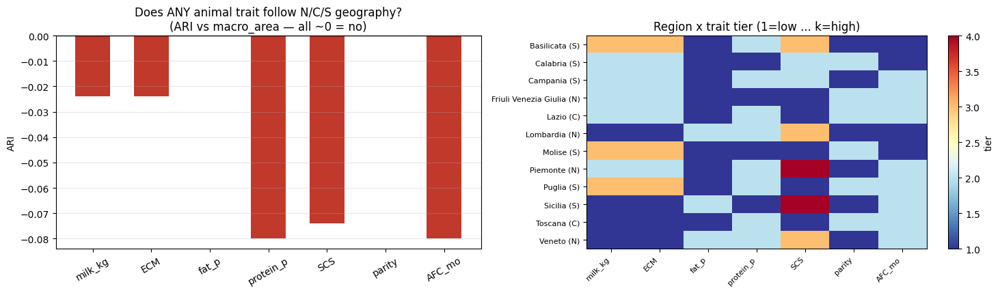

In [31]:
# 7.5 Per-variable region clustering (one trait at a time, NO PCA) + 7.6 synthesis
def tiers_from_labels(vals, lab):
    """Relabel cluster ids to ordinal tiers 1..k by ascending cluster mean (1 = lowest)."""
    order = pd.Series(vals).groupby(lab).mean().sort_values().index.tolist()
    remap = {c: t + 1 for t, c in enumerate(order)}
    return np.array([remap[c] for c in lab])

ANIMAL_VARS = ['milk_kg', 'ECM', 'fat_p', 'protein_p', 'SCS', 'parity', 'AFC_mo']
MIN_REC = 2000
keep = reg.index[reg.records >= MIN_REC]
regmean = reg_df[reg_df.Region.isin(keep)].groupby('Region')[ANIMAL_VARS].mean()
macro = reg_df.groupby('Region')['macro_area'].first().reindex(regmean.index)
print(f'7.5 Per-variable clustering of {len(regmean)} regions (>= {MIN_REC} records)')

tier_mat, rows = pd.DataFrame(index=regmean.index), []
for v in ANIMAL_VARS:
    X = StandardScaler().fit_transform(regmean[[v]].values)
    k, s, lab = best_k_small(X, range(2, 5))
    tier = tiers_from_labels(regmean[v].values, lab)
    tier_mat[v] = tier
    rows.append({'variable': v, 'best_k': k, 'silhouette': round(float(s), 3),
                 'ARI_vs_macroarea': round(float(adjusted_rand_score(macro, lab)), 3)})
pv = pd.DataFrame(rows)
display(pv)
print('Each trait splits the regions cleanly (high silhouette) — but ARI vs macro_area ~ 0 means')
print('NONE of them follow North/Central/South. Animal traits are HERD-level, not regional.')

Xc_ = StandardScaler().fit_transform(tier_mat.values)
kc, sc_, labc = best_k_small(Xc_, range(2, 6))
print(f'\n7.6 Consensus across all traits: k={kc}, silhouette={round(float(sc_),3)}, '
      f'ARI vs macro_area={adjusted_rand_score(macro, labc):+.3f}')
print('\nWhich traits carve the regions alike (Spearman of tier columns):')
display(tier_mat.corr(method='spearman').round(2))

fig, ax = plt.subplots(1, 2, figsize=(15, 4.4))
ax[0].bar(pv.variable, pv.ARI_vs_macroarea, color='#c0392b', width=.6)
ax[0].axhline(0, color='k', lw=1)
ax[0].set(title='Does ANY animal trait follow N/C/S geography?\n(ARI vs macro_area — all ~0 = no)',
          ylabel='ARI'); ax[0].tick_params(axis='x', rotation=30); ax[0].grid(alpha=.3, axis='y')
im = ax[1].imshow(tier_mat.values, cmap='RdYlBu_r', aspect='auto')
ax[1].set_xticks(range(len(ANIMAL_VARS))); ax[1].set_xticklabels(ANIMAL_VARS, rotation=45, ha='right', fontsize=8)
ax[1].set_yticks(range(len(tier_mat))); ax[1].set_yticklabels([f'{r} ({macro[r][0]})' for r in tier_mat.index], fontsize=8)
ax[1].set_title('Region x trait tier (1=low ... k=high)'); fig.colorbar(im, ax=ax[1], label='tier')
plt.tight_layout(); plt.show()

7.7 Per-region heat response (per +10 THI above the farm-month normal, summer):


,Region,macro_area,n_animals,milk_kg_per10,milk_kg_ci95,SCS_per10,SCS_ci95
2,Veneto,North,1082,-0.364,0.207,0.343,0.205
11,Molise,South,285,-0.179,0.242,0.262,0.127
9,Calabria,South,1718,-0.169,0.323,0.259,0.352
4,Toscana,Central,346,0.301,0.361,0.239,0.792
5,Lazio,Central,24543,-0.082,0.097,0.117,0.129
0,Piemonte,North,2071,-0.242,0.031,0.083,0.153
7,Puglia,South,3191,-0.172,0.232,0.040,0.078
1,Lombardia,North,2639,-0.137,0.218,0.033,0.065
8,Basilicata,South,1967,0.048,0.167,0.027,0.288
3,Friuli Venezia Giulia,North,1066,-0.080,0.081,0.013,0.027



Heat-response types: k=2, silhouette=0.558


,milk_kg_per10,SCS_per10
heat_cl,,
0,-0.101,0.129
1,-0.648,-0.232


  type 0: Veneto, Molise, Calabria, Toscana, Lazio, Piemonte, Puglia, Lombardia, Basilicata, Friuli Venezia Giulia, Campania
  type 1: Sicilia


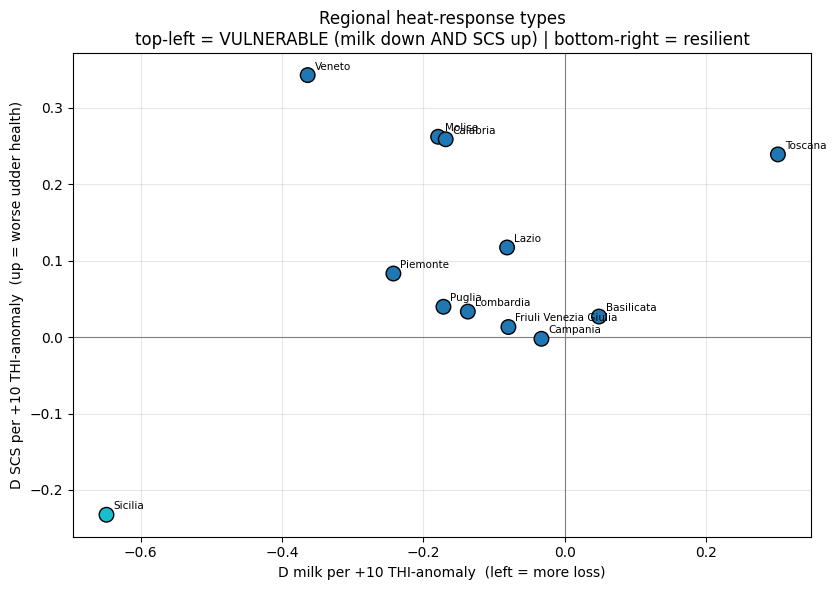

In [32]:
# 7.7 Regional HEAT-RESPONSE clustering — group regions by HOW THEY RESPOND to heat.
# (Climate_Signal Part 9 plots the per-region forest; here we CLUSTER regions on their
#  (milk-slope, SCS-slope) pair to name heat-response TYPES — a different question.)
# Spec: within-animal, summer (warm half), lactation stage controlled with DIM + DIM^2,
# farm-clustered SE (single-farm regions fall back to HC1). Scaled to per +10 THI-anomaly.
reg_df['thi_anom'] = reg_df['THI_1_avg'] - reg_df.groupby(['Farm_Code', 'month'])['THI_1_avg'].transform('mean')
Sm = reg_df[reg_df.month.isin(WARM_MONTHS)].copy()
Sm['DIM2'] = Sm['DIM'].astype(float) ** 2

def region_slope(sub, trait, min_animals=200):
    d = sub[[trait, 'thi_anom', 'DIM', 'DIM2', 'Animal_ID', 'Farm_Code']].dropna().copy()
    if d.Animal_ID.nunique() < min_animals:
        return None
    g = d.groupby('Animal_ID')
    for c in [trait, 'thi_anom', 'DIM', 'DIM2']:
        d[c + '_w'] = d[c] - g[c].transform('mean')
    m = smf.ols(f'{trait}_w ~ thi_anom_w + DIM_w + DIM2_w - 1', data=d)
    r = (m.fit(cov_type='cluster', cov_kwds={'groups': d.Farm_Code}) if d.Farm_Code.nunique() >= 2
         else m.fit(cov_type='HC1'))
    return round(10 * r.params['thi_anom_w'], 4), round(10 * 1.96 * r.bse['thi_anom_w'], 4)

hrows = []
for rg in Sm.Region.unique():
    sub = Sm[Sm.Region == rg]
    row = {'Region': rg, 'macro_area': sub.macro_area.iloc[0], 'n_animals': sub.Animal_ID.nunique()}
    ok = True
    for t in ['milk_kg', 'SCS']:
        res = region_slope(sub, t)
        if res is None: ok = False; break
        row[f'{t}_per10'], row[f'{t}_ci95'] = res
    if ok: hrows.append(row)
hh = pd.DataFrame(hrows).sort_values('SCS_per10', ascending=False)
print('7.7 Per-region heat response (per +10 THI above the farm-month normal, summer):')
display(hh)

Xh = StandardScaler().fit_transform(hh[['milk_kg_per10', 'SCS_per10']])
k_h, s_h, lab_h = best_k_small(Xh, range(2, 5))
hh['heat_cl'] = lab_h
print(f'\nHeat-response types: k={k_h}, silhouette={s_h}')
display(hh.groupby('heat_cl')[['milk_kg_per10', 'SCS_per10']].mean().round(3))
for c in sorted(hh.heat_cl.unique()):
    print(f'  type {c}: {", ".join(hh[hh.heat_cl == c].Region)}')

fig, ax = plt.subplots(figsize=(8.5, 6))
ax.scatter(hh.milk_kg_per10, hh.SCS_per10, c=hh.heat_cl, cmap='tab10', s=110, edgecolor='k', zorder=3)
for _, r in hh.iterrows():
    ax.annotate(r.Region, (r.milk_kg_per10, r.SCS_per10), fontsize=7.5, xytext=(5, 4), textcoords='offset points')
ax.axhline(0, color='gray', lw=.8); ax.axvline(0, color='gray', lw=.8)
ax.set(xlabel='D milk per +10 THI-anomaly  (left = more loss)',
       ylabel='D SCS per +10 THI-anomaly  (up = worse udder health)',
       title='Regional heat-response types\ntop-left = VULNERABLE (milk down AND SCS up) | bottom-right = resilient')
ax.grid(alpha=.3); plt.tight_layout(); plt.show()

In [33]:
# 7.8 Season split — does the FARM structure itself shift between summer and winter?
print('7.8 Farm clustering within each season (does geography look different in summer?):')
for name, mask in [('summer', reg_df.month.isin(WARM_MONTHS)), ('winter', ~reg_df.month.isin(WARM_MONTHS))]:
    fm = (reg_df[mask].groupby('Farm_Code')
          .agg(milk_kg=('milk_kg', 'mean'), SCS=('SCS', 'mean'),
               THI_avg=('THI_1_avg', 'mean'), THI_max=('THI_1_max', 'mean')).dropna())
    ma = reg_df[mask].groupby('Farm_Code')['macro_area'].first().reindex(fm.index)
    X = StandardScaler().fit_transform(fm)
    k, s, lab = best_k_small(X, range(2, 6))
    ari = adjusted_rand_score(ma, KMeans(3, n_init=10, random_state=RANDOM_STATE).fit_predict(X))
    print(f'  {name}: farms={len(fm)}  best k={k}  silhouette={s}  ARI(k=3) vs macro_area={ari:+.3f}')
print('If both seasons give a similar silhouette/ARI, the farm structure is stable — geography does')
print('not appear or vanish with the season.')

7.8 Farm clustering within each season (does geography look different in summer?):
  summer: farms=315  best k=2  silhouette=0.26  ARI(k=3) vs macro_area=+0.033
  winter: farms=316  best k=4  silhouette=0.274  ARI(k=3) vs macro_area=+0.090
If both seasons give a similar silhouette/ARI, the farm structure is stable — geography does
not appear or vanish with the season.


In [34]:
# 7.9 Farm-level recovery — which SINGLE animal trait is the most "geographic"?
farm_pv = reg_df.groupby('Farm_Code').agg(records=('milk_kg', 'size'), **{v: (v, 'mean') for v in ANIMAL_VARS})
farm_pv['Region']     = reg_df.groupby('Farm_Code')['Region'].first()
farm_pv['macro_area'] = reg_df.groupby('Farm_Code')['macro_area'].first()
farm_pv = farm_pv[farm_pv.records >= 200].dropna()

rows = []
for v in ANIMAL_VARS:
    X = StandardScaler().fit_transform(farm_pv[[v]])
    k, s, lab = best_k_small(X, range(2, 7))
    rows.append({'variable': v, 'best_k': k, 'silhouette': round(float(s), 3),
                 'ARI_vs_Region': round(float(adjusted_rand_score(farm_pv.Region, lab)), 3),
                 'ARI_vs_macroarea': round(float(adjusted_rand_score(farm_pv.macro_area, lab)), 3)})
fr = pd.DataFrame(rows).sort_values('ARI_vs_macroarea', ascending=False)
print(f'7.9 Farm-level recovery — {len(farm_pv)} farms, each trait clustered ALONE:')
display(fr)
print(f'Most "geographic" single trait: {fr.iloc[0].variable} (ARI vs macro_area = {fr.iloc[0].ARI_vs_macroarea})')
print('-> even the best is ~0: no single animal trait recovers geography at farm level either.')

7.9 Farm-level recovery — 299 farms, each trait clustered ALONE:


,variable,best_k,silhouette,ARI_vs_Region,ARI_vs_macroarea
4,SCS,2,0.576,0.011,0.005
3,protein_p,5,0.565,0.010,0.004
5,parity,2,0.618,0.005,0.001
6,AFC_mo,4,0.580,0.028,0.001
0,milk_kg,2,0.553,-0.008,-0.005
1,ECM,5,0.538,-0.012,-0.011
2,fat_p,2,0.645,-0.043,-0.026


Most "geographic" single trait: SCS (ARI vs macro_area = 0.005)
-> even the best is ~0: no single animal trait recovers geography at farm level either.


## Honest conclusions

- **No discrete production groups** — raw traits are a continuum; the clean feature pairs were a
  `parity` discreteness artifact (Parts 1–3).
- **Real structure = lactation-curve shape** — interpretable curve *types* from Wood's features (Part 5).
- **Heat → milk:** statistically significant but practically ~0 (buffalo are heat-tolerant) — report as a null.
- **Heat → SCS:** hotter-than-normal summer days raise SCS — modest but robust, the welfare signal.
- **Heat-tolerance classes:** *not* identifiable (out-of-sample slope stability collapses on clean heat);
  and heat raises SCS roughly across all curve types rather than isolating one vulnerable type.